In [34]:
import mujoco_py
import numpy as np
import matplotlib.pyplot as plt
from mujoco_parser import *
from util import *
from util_fk import *
import cv2

np.set_printoptions(precision=2)
plt.rc('xtick',labelsize=6); plt.rc('ytick',labelsize=6)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("Ready.")

Ready.


In [35]:
env = MuJoCoParserClass(name='UR5e',xml_path='../asset/ur5e/UR5_rg2_gripper.xml')
# env = MuJoCoParserClass(name='UR5e',xml_path='../asset/ur5e/ril_robot.xml')
print ("[%s] parsed."%(env.name))

[UR5e] parsed.


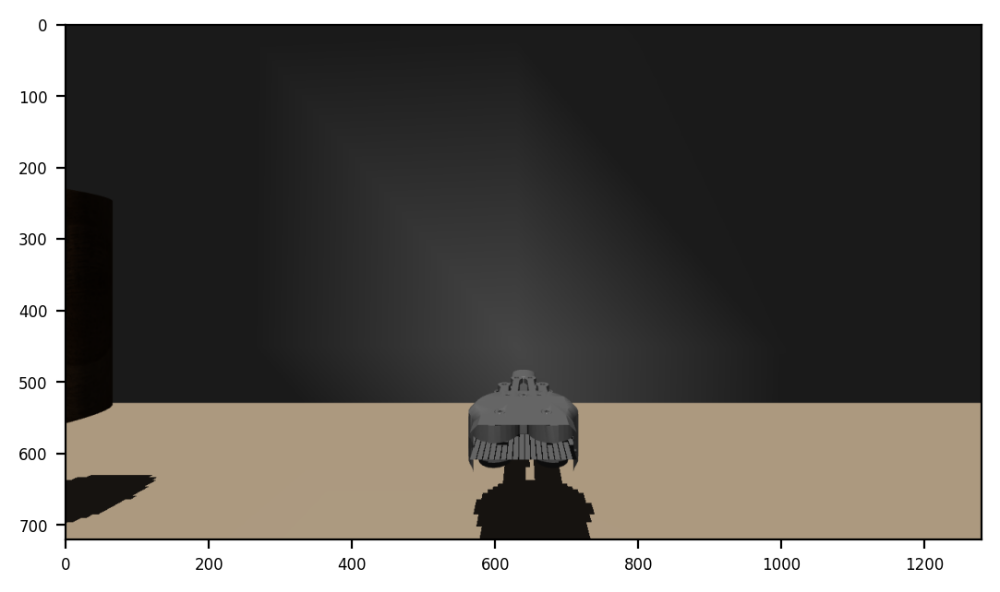

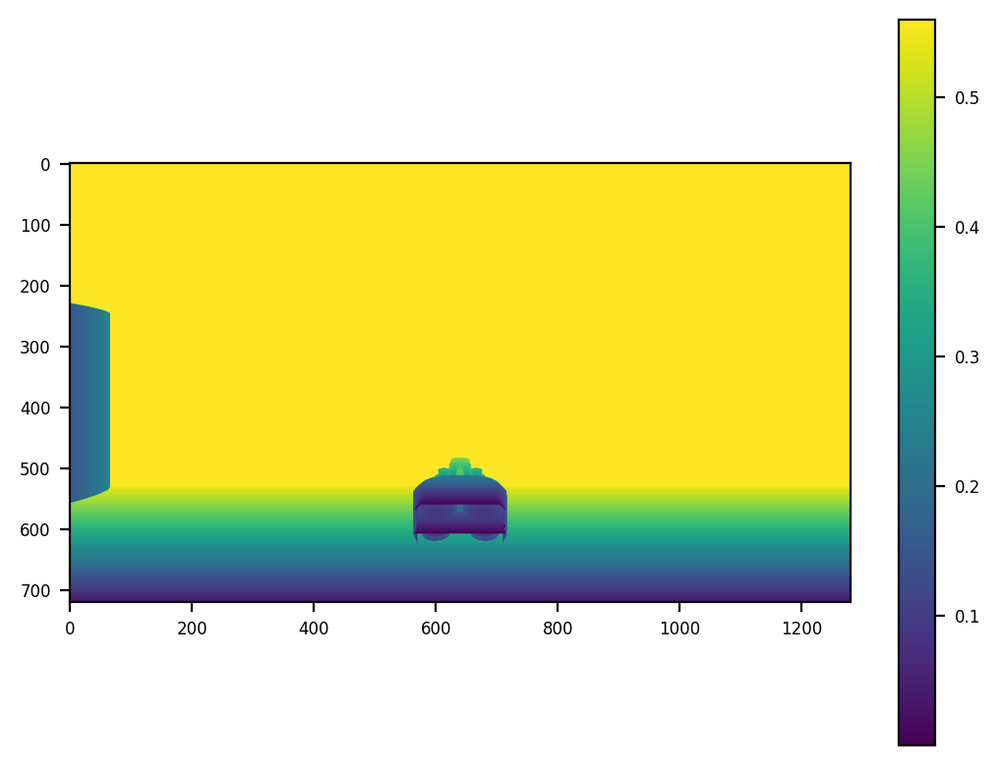

In [36]:
env._get_viewer("rgb_array").render(env.render_width, env.render_height, camera_id=env.model.camera_name2id("egocentric"))
img, img_depth = env.viewer.read_pixels(width=env.render_width,height=env.render_height,depth=True)

img = cv2.flip(cv2.rotate(img,cv2.ROTATE_180),1)        # 0:up<->down, 1:left<->right
img_depth = cv2.flip(cv2.rotate(img_depth,cv2.ROTATE_180),1)        # 0:up<->down, 1:left<->right

plt.imshow(img)
plt.show()

plt.imshow(img_depth)
plt.colorbar()
plt.show()

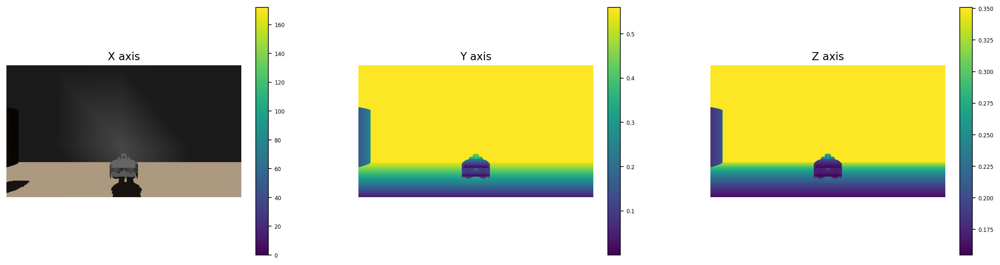

In [37]:
# Up-right table view.
cam_infos = env.set_cam_infos(cam_distance  = 0.0,
                    cam_azimuth   = 0,        # Z-axis: Yaw
                    cam_elevation = -90,      # X-axis: Roll                        
                    cam_lookat    = [1.0, 0.0, 2.5])  # arbitrary offset on camera.

# update object, robot configurations
env.forward(INCREASE_TICK=False)

for _ in range(2):
    img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
    img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
    img_real = np.array(env.depth2meters(img_depth))

plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.imshow(img); plt.axis('off')
plt.title("X axis")
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(img_depth); plt.axis('off')
plt.title("Y axis")
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(img_real); plt.axis('off')
plt.title("Z axis")
plt.colorbar()
plt.show()

In [38]:
print(env.render_width)
print(env.render_height)

1280
720


In [39]:
def get_calibration_data(env, img, img_depth, camera_name, from_link='ur_rg2_gripper_base_link', to_link='ur_base_link', file_name=None, verbose=True):
    # Get matrix A.
    # Transformation matrix about 'camera to target'.
    tagpose, img = get_apriltag_pose(env, img, img_depth, camera_name=camera_name)

    if tagpose is not None:    
        R_cam2target = tagpose[:3, :3]
        p_cam2target = tagpose[:3, 3]

        # inverse of T_cam2target matrix
        p_target2cam = -np.linalg.inv(R_cam2target) @ p_cam2target
        R_target2cam = np.linalg.inv(R_cam2target)
        T_target2cam = cv2.hconcat((R_target2cam, p_target2cam))      # 3x4
        T_target2cam = np.vstack((T_target2cam, np.array([0,0,0,1])))   # 4x4

    # Get matrix B.
    # Transformation matrix about 'ee to base'.
    T_ee2bs = get_homogeneous_matrix(env, from_link=from_link, to_link=to_link, verbose=True)
    R_ee2bs = T_ee2bs[:3, :3]
    p_ee2bs = T_ee2bs[:3, 3]

    if tagpose is not None and verbose == True:    
        print(T_target2cam)
        print(T_ee2bs)

    if tagpose is not None:
        plt.imshow(img)
        plt.show()
        np.save(f'./data/20230220/R_ee2bs_{file_name}.npy', R_ee2bs)
        np.save(f'./data/20230220/p_ee2bs_{file_name}.npy', p_ee2bs)
        np.save(f'./data/20230220/R_target2cam_{file_name}.npy', R_target2cam)
        np.save(f'./data/20230220/p_target2cam_{file_name}.npy', p_target2cam)
        print("data saved completely.")
    else:
        print("data doesn't saved.")


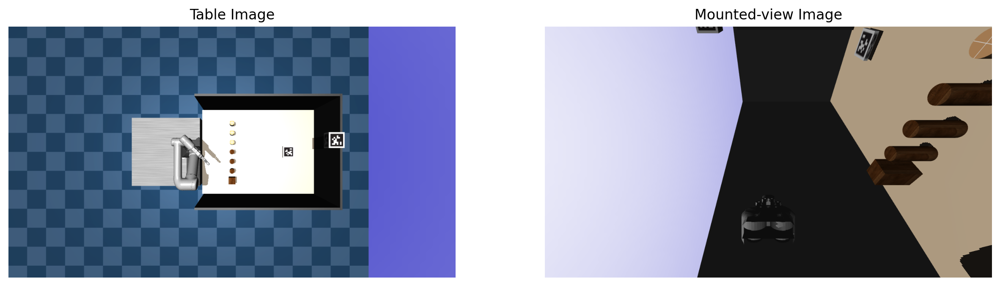

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.15e-07 -7.08e-01  7.07e-01  3.46e-01]
 [ 1.97e-04  7.07e-01  7.08e-01 -3.51e-02]
 [-1.00e+00  1.39e-04  1.39e-04  1.27e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.15e-07  1.97e-04 -1.00e+00  4.84e-01]
 [-7.08e-01  7.07e-01  1.39e-04  1.42e-01]
 [ 7.07e-01  7.08e-01  1.39e-04 -9.23e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


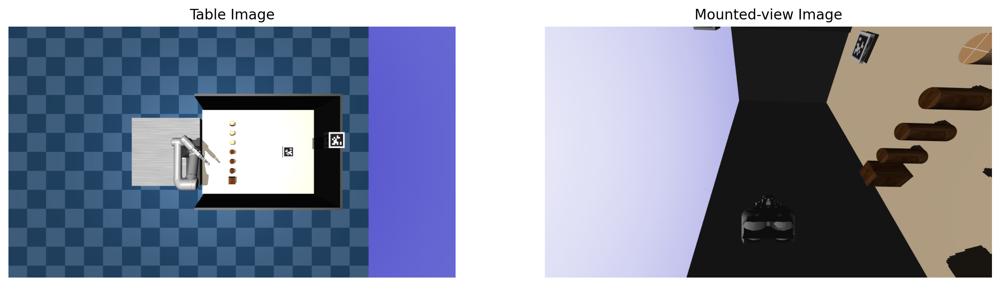

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-1.38e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-3.13e-02  7.06e-01  7.07e-01 -3.20e-02]
 [-1.00e+00 -2.21e-02 -2.21e-02  1.26e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-1.38e-06 -3.13e-02 -1.00e+00  4.69e-01]
 [-7.08e-01  7.06e-01 -2.21e-02  1.50e-01]
 [ 7.07e-01  7.07e-01 -2.21e-02 -8.41e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


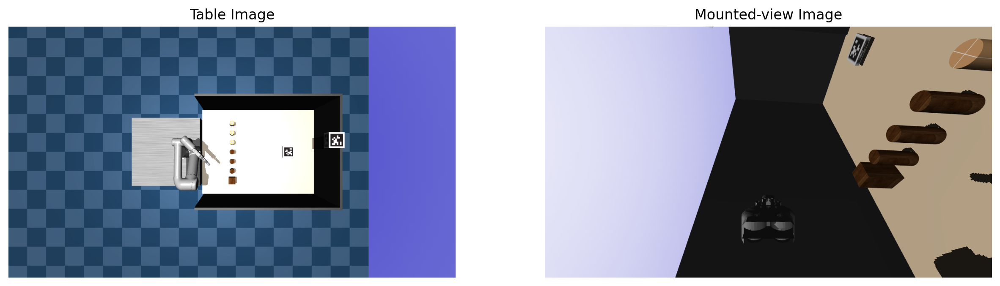

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-2.24e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-6.27e-02  7.05e-01  7.06e-01 -2.85e-02]
 [-9.98e-01 -4.43e-02 -4.44e-02  1.25e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-2.24e-06 -6.27e-02 -9.98e-01  4.53e-01]
 [-7.08e-01  7.05e-01 -4.43e-02  1.58e-01]
 [ 7.07e-01  7.06e-01 -4.44e-02 -7.67e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


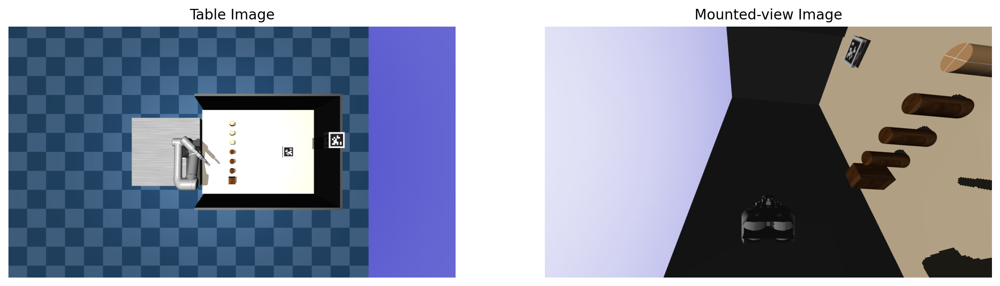

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-2.86e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-9.40e-02  7.03e-01  7.05e-01 -2.47e-02]
 [-9.96e-01 -6.64e-02 -6.65e-02  1.23e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-2.86e-06 -9.40e-02 -9.96e-01  4.37e-01]
 [-7.08e-01  7.03e-01 -6.64e-02  1.64e-01]
 [ 7.07e-01  7.05e-01 -6.65e-02 -7.03e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


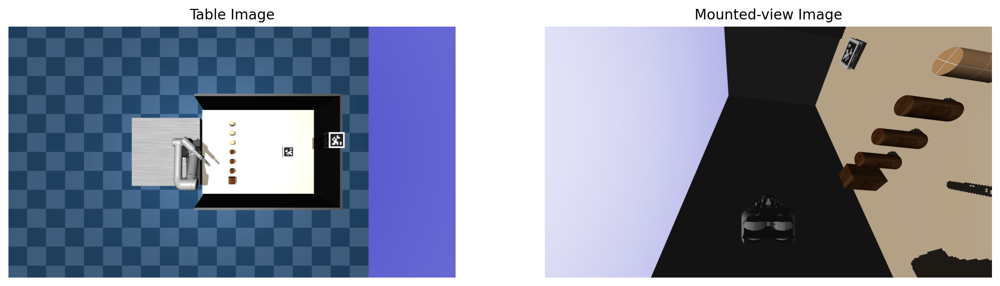

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.27e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-1.25e-01  7.01e-01  7.02e-01 -2.06e-02]
 [-9.92e-01 -8.85e-02 -8.87e-02  1.22e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.27e-06 -1.25e-01 -9.92e-01  4.21e-01]
 [-7.08e-01  7.01e-01 -8.85e-02  1.70e-01]
 [ 7.07e-01  7.02e-01 -8.87e-02 -6.48e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


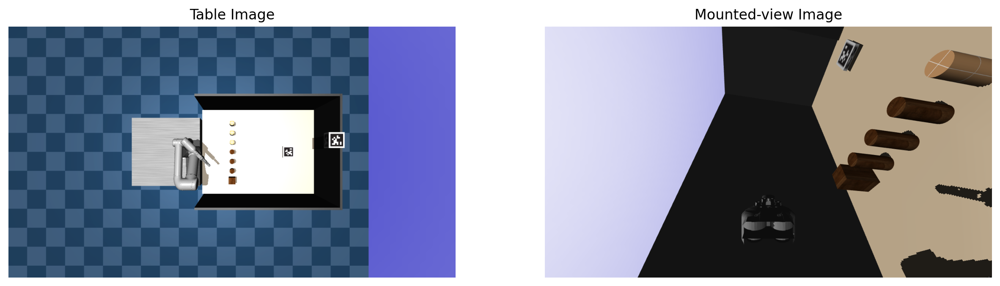

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.54e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-1.56e-01  6.98e-01  6.99e-01 -1.62e-02]
 [-9.88e-01 -1.10e-01 -1.11e-01  1.20e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.54e-06 -1.56e-01 -9.88e-01  4.05e-01]
 [-7.08e-01  6.98e-01 -1.10e-01  1.74e-01]
 [ 7.07e-01  6.99e-01 -1.11e-01 -6.01e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


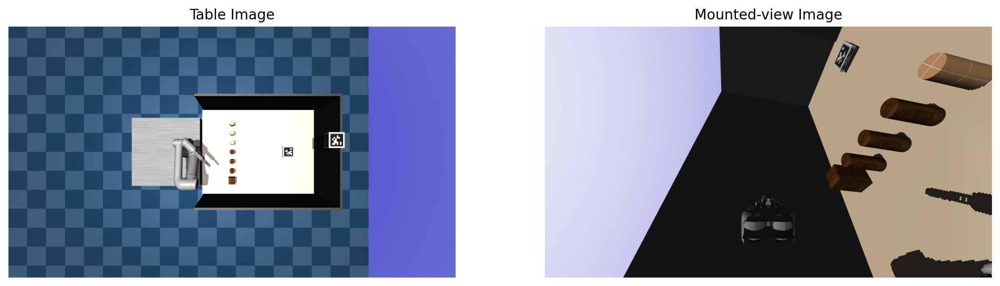

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.70e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-1.87e-01  6.94e-01  6.95e-01 -1.14e-02]
 [-9.82e-01 -1.32e-01 -1.33e-01  1.19e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.70e-06 -1.87e-01 -9.82e-01  3.89e-01]
 [-7.08e-01  6.94e-01 -1.32e-01  1.78e-01]
 [ 7.07e-01  6.95e-01 -1.33e-01 -5.63e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


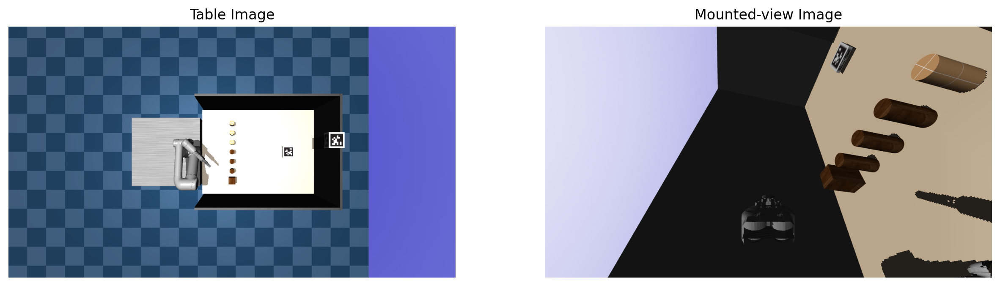

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.77e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-2.18e-01  6.90e-01  6.91e-01 -6.36e-03]
 [-9.76e-01 -1.54e-01 -1.54e-01  1.17e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.77e-06 -2.18e-01 -9.76e-01  3.73e-01]
 [-7.08e-01  6.90e-01 -1.54e-01  1.81e-01]
 [ 7.07e-01  6.91e-01 -1.54e-01 -5.34e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


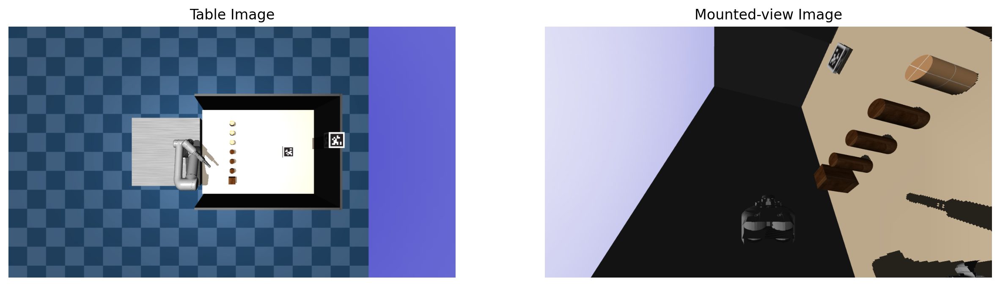

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.79e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-2.49e-01  6.84e-01  6.85e-01 -1.00e-03]
 [-9.69e-01 -1.76e-01 -1.76e-01  1.16e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.79e-06 -2.49e-01 -9.69e-01  3.58e-01]
 [-7.08e-01  6.84e-01 -1.76e-01  1.83e-01]
 [ 7.07e-01  6.85e-01 -1.76e-01 -5.14e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


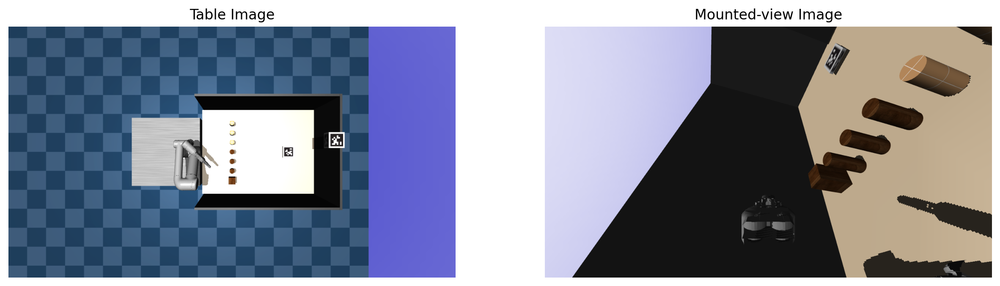

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.77e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-2.79e-01  6.78e-01  6.80e-01  4.65e-03]
 [-9.60e-01 -1.97e-01 -1.97e-01  1.15e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.77e-06 -2.79e-01 -9.60e-01  3.42e-01]
 [-7.08e-01  6.78e-01 -1.97e-01  1.84e-01]
 [ 7.07e-01  6.80e-01 -1.97e-01 -5.01e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


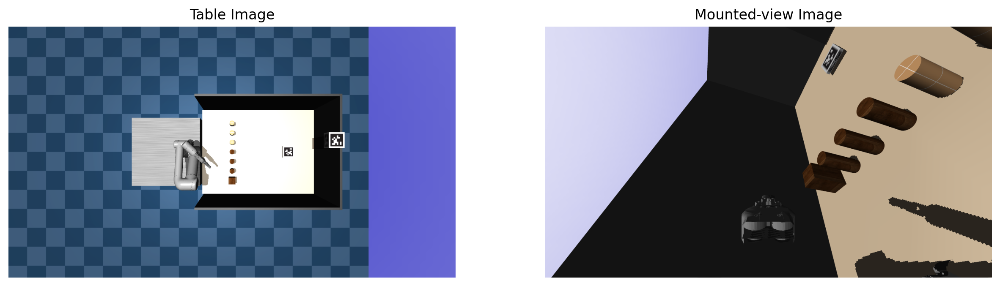

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.73e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-3.09e-01  6.72e-01  6.73e-01  1.06e-02]
 [-9.51e-01 -2.18e-01 -2.19e-01  1.13e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.73e-06 -3.09e-01 -9.51e-01  3.28e-01]
 [-7.08e-01  6.72e-01 -2.18e-01  1.85e-01]
 [ 7.07e-01  6.73e-01 -2.19e-01 -4.97e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


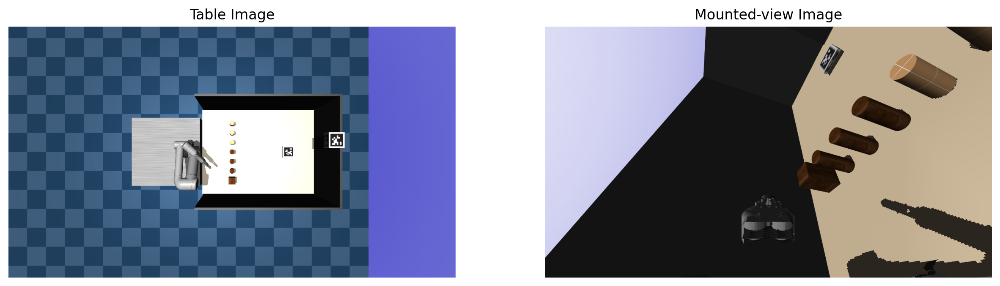

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.68e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-3.39e-01  6.65e-01  6.66e-01  1.68e-02]
 [-9.41e-01 -2.39e-01 -2.40e-01  1.12e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.68e-06 -3.39e-01 -9.41e-01  3.13e-01]
 [-7.08e-01  6.65e-01 -2.39e-01  1.84e-01]
 [ 7.07e-01  6.66e-01 -2.40e-01 -5.00e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


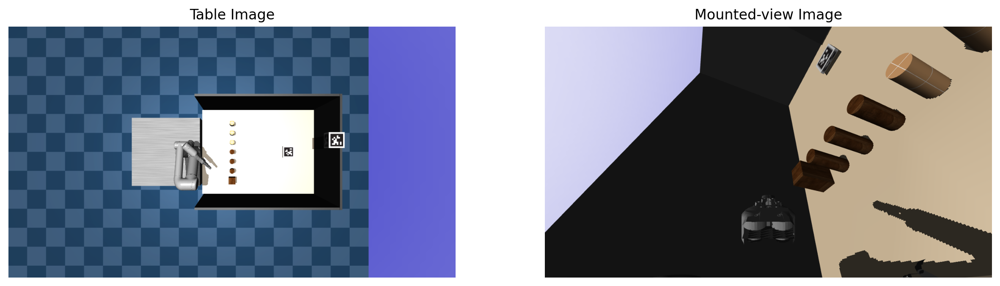

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.61e-06 -7.08e-01  7.07e-01  3.46e-01]
 [-3.68e-01  6.57e-01  6.58e-01  2.33e-02]
 [-9.30e-01 -2.60e-01 -2.61e-01  1.10e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.61e-06 -3.68e-01 -9.30e-01  2.99e-01]
 [-7.08e-01  6.57e-01 -2.60e-01  1.83e-01]
 [ 7.07e-01  6.58e-01 -2.61e-01 -5.11e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


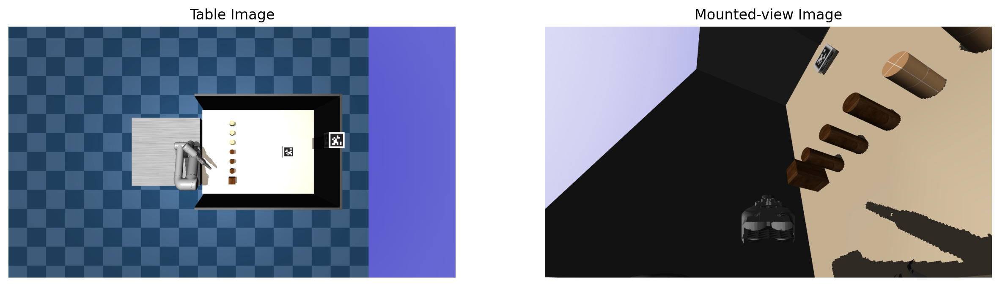

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 9.55e-06 -7.07e-01  7.07e-01  3.46e-01]
 [-3.96e-01  6.49e-01  6.49e-01  3.00e-02]
 [-9.18e-01 -2.80e-01 -2.80e-01  1.09e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 9.55e-06 -3.96e-01 -9.18e-01  2.86e-01]
 [-7.07e-01  6.49e-01 -2.80e-01  1.81e-01]
 [ 7.07e-01  6.49e-01 -2.80e-01 -5.32e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


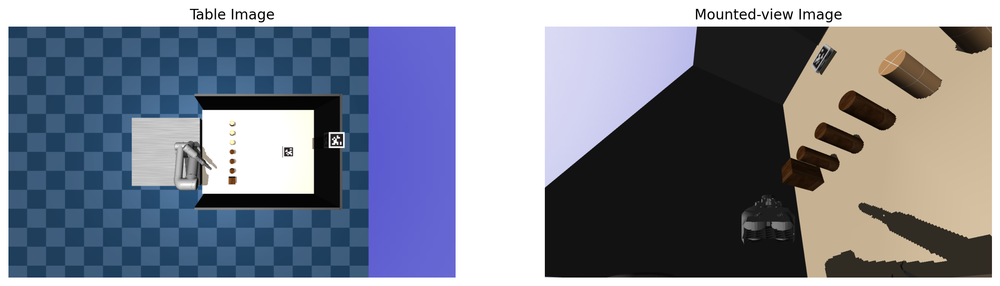

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-3.84e-05 -7.05e-01  7.09e-01  3.46e-01]
 [-4.24e-01  6.42e-01  6.39e-01  3.68e-02]
 [-9.06e-01 -3.00e-01 -2.99e-01  1.07e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-3.84e-05 -4.24e-01 -9.06e-01  2.73e-01]
 [-7.05e-01  6.42e-01 -3.00e-01  1.79e-01]
 [ 7.09e-01  6.39e-01 -2.99e-01 -5.59e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


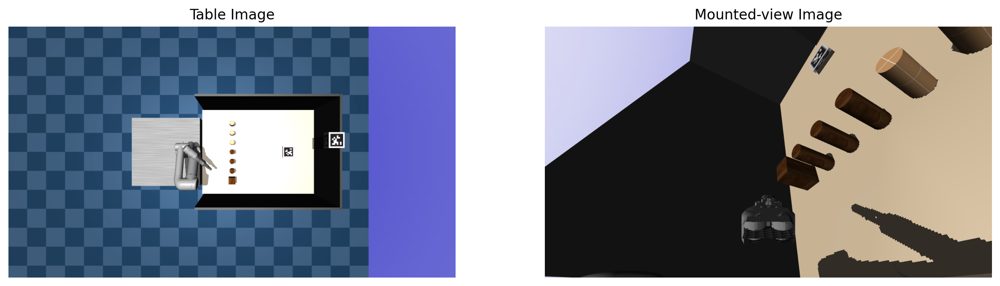

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-1.60e-04 -7.05e-01  7.09e-01  3.46e-01]
 [-4.53e-01  6.33e-01  6.28e-01  4.38e-02]
 [-8.92e-01 -3.21e-01 -3.19e-01  1.06e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-1.60e-04 -4.53e-01 -8.92e-01  2.62e-01]
 [-7.05e-01  6.33e-01 -3.21e-01  1.76e-01]
 [ 7.09e-01  6.28e-01 -3.19e-01 -5.86e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


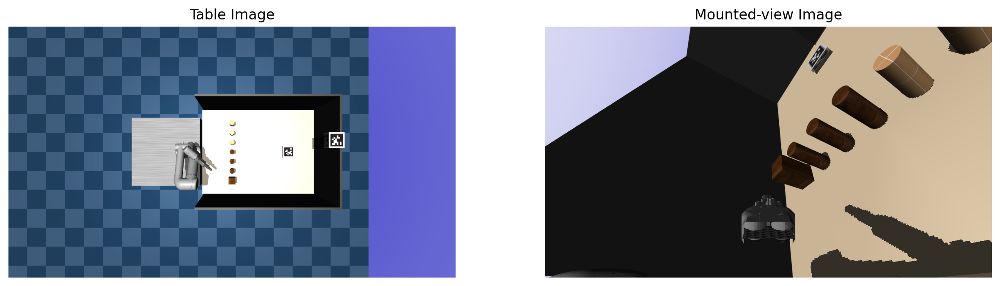

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 1.97e-04 -7.04e-01  7.10e-01  3.46e-01]
 [-4.82e-01  6.22e-01  6.17e-01  5.09e-02]
 [-8.76e-01 -3.42e-01 -3.39e-01  1.05e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 1.97e-04 -4.82e-01 -8.76e-01  2.51e-01]
 [-7.04e-01  6.22e-01 -3.42e-01  1.74e-01]
 [ 7.10e-01  6.17e-01 -3.39e-01 -6.16e-02]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
data doesn't saved.


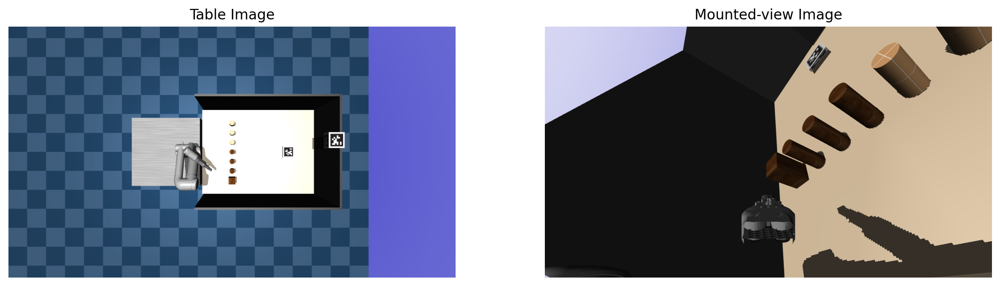

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.   -0.7   0.71  0.35]
 [-0.52  0.61  0.6   0.06]
 [-0.86 -0.37 -0.36  1.03]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.   -0.52 -0.86  0.24]
 [-0.7   0.61 -0.37  0.17]
 [ 0.71  0.6  -0.36 -0.07]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


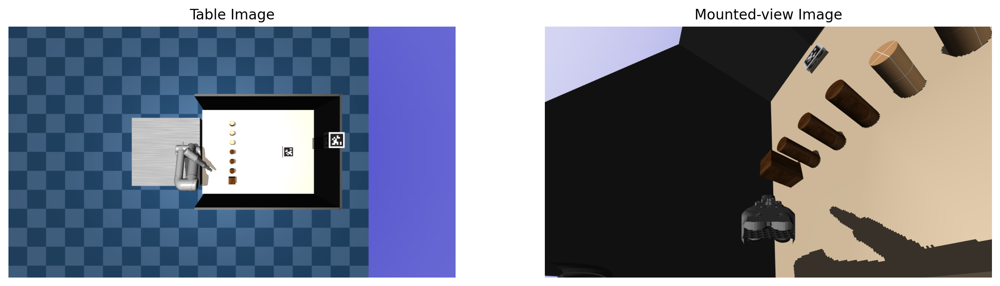

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-1.01e-03 -7.00e-01  7.15e-01  3.46e-01]
 [-5.53e-01  5.96e-01  5.82e-01  6.81e-02]
 [-8.33e-01 -3.95e-01 -3.88e-01  1.02e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-0.   -0.55 -0.83  0.23]
 [-0.7   0.6  -0.39  0.17]
 [ 0.71  0.58 -0.39 -0.07]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


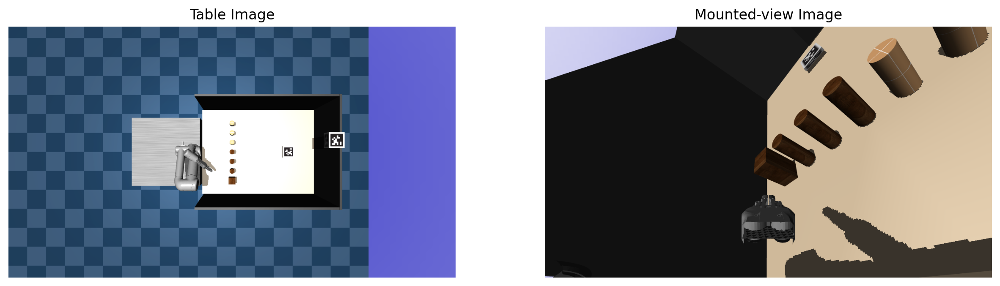

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[-0.   -0.7   0.72  0.35]
 [-0.59  0.58  0.56  0.08]
 [-0.81 -0.42 -0.41  1.01]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[-0.   -0.59 -0.81  0.22]
 [-0.7   0.58 -0.42  0.16]
 [ 0.72  0.56 -0.41 -0.07]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


In [41]:
import math

rpy_list = []
r_list = []
eef_list = []

tagpose_list=[]
bs2ee_list=[]
file_name = 0

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects

for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

max_tick = 20
env.tick = 0

while env.tick < max_tick:
    # Set Joint Configurations
    # init_configurations = [-math.pi/2, -3*math.pi/4, 3*math.pi/4, math.pi/2+0.02*env.tick*math.pi, 0.1+0.02*env.tick*math.pi, -math.pi/2 ]
    init_configurations = [-math.pi/2, -3 * math.pi/4, 3 * math.pi/4 + 0.01*env.tick*math.pi, math.pi-0.02*env.tick*math.pi, math.pi/4, -math.pi/2]
    # init_configurations = [-1.63, -2.45, 2.23, 1.57, 0.0, -1.4]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        env._get_viewer("rgb_array").render(env.render_width, env.render_height, camera_id=env.model.camera_name2id("main1"))
        img_table, img_table_depth = env.viewer.read_pixels(width=env.render_width,height=env.render_height,depth=True)        

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")
    
    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    env._get_viewer("rgb_array").render(env.render_width, env.render_height, camera_id=env.model.camera_name2id("egocentric"))
    img, img_depth = env.viewer.read_pixels(width=env.render_width,height=env.render_height,depth=True)        
    img = cv2.flip(cv2.rotate(img,cv2.ROTATE_180),1)        # 0:up<->down, 1:left<->right
    img_depth = cv2.flip(cv2.rotate(img_depth,cv2.ROTATE_180),1)        # 0:up<->down, 1:left<->right
    img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    T_april, img = get_apriltag_pose(env, img, img_real, camera_name='egocentric')
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)

    get_calibration_data(env, img, img_depth, camera_name='egocentric', from_link='ur_rg2_gripper_base_link', to_link='ur_base_link', file_name=file_name, verbose=True)
    file_name += 1

    tagpose_list.append(T_april)
    bs2ee_list.append(bs2ee_matrix)

    # delete all the markers.
    del env.viewer._markers[:]


In [18]:
data_num = 10

R_ee2bs = [np.load(f"./data/20230217/R_ee2bs_{i+10}.npy") for i in range(data_num)]
p_ee2bs = [np.load(f"./data/20230217/p_ee2bs_{i+10}.npy") for i in range(data_num)]
R_target2cam = [np.load(f"./data/20230217/R_target2cam_{i+10}.npy") for i in range(data_num)]
p_target2cam = [np.load(f"./data/20230217/p_target2cam_{i+10}.npy") for i in range(data_num)]

# method: CALIB_HAND_EYE_TSAI CALIB_HAND_EYE_PARK CALIB_HAND_EYE_HORAUD CALIB_HAND_EYE_ANDREFF CALIB_HAND_EYE_DANIILIDIS 
R_ext, p_ext = cv2.calibrateHandEye(R_ee2bs, p_ee2bs, R_target2cam, p_target2cam, method=cv2.CALIB_HAND_EYE_DANIILIDIS)
T_ext = cv2.hconcat((R_ext, p_ext))      # 3x4
T_ext = np.vstack((T_ext, np.array([0,0,0,1])))   # 4x4
T_ext

array([[-0.87,  0.49, -0.01, -0.69],
       [ 0.49,  0.87, -0.04,  0.14],
       [-0.01, -0.04, -1.  , -1.29],
       [ 0.  ,  0.  ,  0.  ,  1.  ]])

In [19]:
cam_id = env.model.camera_name2id("egocentric")
print(cam_id)

# Rotation of camera in world coordinates
cam_R = env.model.cam_mat0[cam_id]
cam_R = np.reshape(env.cam_rot_mat, (3, 3))

cam_R_rpy = r2rpy(cam_R)
print(cam_R_rpy)

# Position of camera in world coordinates
cam_p = env.model.cam_pos0[cam_id]

T_cam = cv2.hconcat((cam_R, cam_p))      # 3x4
T_cam = np.vstack((T_cam, np.array([0,0,0,1])))   # 4x4
T_cam

1
[ 1.57 -0.   -0.  ]


array([[ 1.00e+00,  0.00e+00, -0.00e+00,  0.00e+00],
       [-0.00e+00,  7.96e-04, -1.00e+00,  1.01e-02],
       [ 0.00e+00,  1.00e+00,  7.96e-04,  9.00e-02],
       [ 0.00e+00,  0.00e+00,  0.00e+00,  1.00e+00]])

In [20]:
wrist_p = env.get_p_body("ur_wrist_3_link")
wrist_R = env.get_R_body("ur_wrist_3_link")

wrist_R_rpy = r2rpy(wrist_R)
print(wrist_R_rpy)

T_wrist = cv2.hconcat((wrist_R, wrist_p))      # 3x4
T_wrist = np.vstack((T_wrist, np.array([0,0,0,1])))   # 4x4
T_wrist

[-2.94e+00  7.91e-06  1.57e+00]


array([[-3.87e-05,  9.80e-01, -1.99e-01,  5.71e-01],
       [ 1.00e+00,  3.64e-05, -1.55e-05, -1.11e-01],
       [-7.91e-06, -1.99e-01, -9.80e-01,  1.49e+00],
       [ 0.00e+00,  0.00e+00,  0.00e+00,  1.00e+00]])

In [51]:
T_bs2wrist3 = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_wrist_3_link', verbose=False)
print(T_bs2wrist3)

R_bs2wrist3 = T_bs2wrist3[:3, :3]

R_bs2wrist3_rpy = r2rpy(R_bs2wrist3)
print(R_bs2wrist3_rpy)

p_bs2wrist3 = T_bs2wrist3[:3, 3]

[[-0.12  0.99 -0.09  0.42]
 [ 0.99  0.13  0.03 -0.11]
 [ 0.04 -0.08 -1.    0.68]
 [ 0.    0.    0.    1.  ]]
[-3.06 -0.04  1.69]


In [52]:
T_bs2wrist3

array([[-0.12,  0.99, -0.09,  0.42],
       [ 0.99,  0.13,  0.03, -0.11],
       [ 0.04, -0.08, -1.  ,  0.68],
       [ 0.  ,  0.  ,  0.  ,  1.  ]])

In [53]:
T_cam

array([[ 1.00e+00,  0.00e+00, -0.00e+00,  0.00e+00],
       [-0.00e+00,  7.96e-04, -1.00e+00,  1.01e-02],
       [ 0.00e+00,  1.00e+00,  7.96e-04,  9.00e-02],
       [ 0.00e+00,  0.00e+00,  0.00e+00,  1.00e+00]])

In [54]:
cam_p - p_bs2wrist3

array([-0.42,  0.12, -0.59])

In [55]:
p_ext

array([[ 0.97],
       [-0.37],
       [ 1.12]])

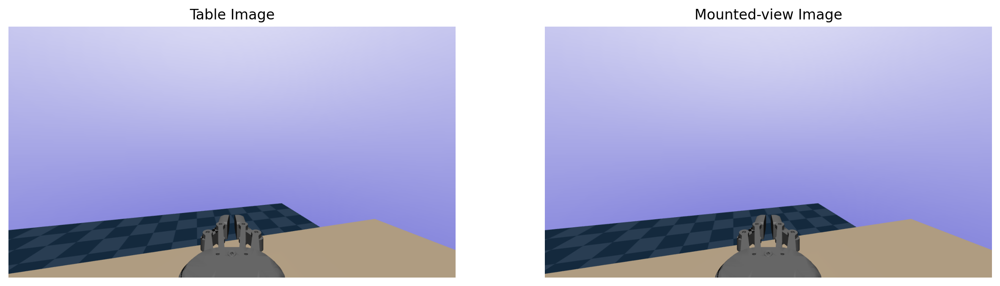

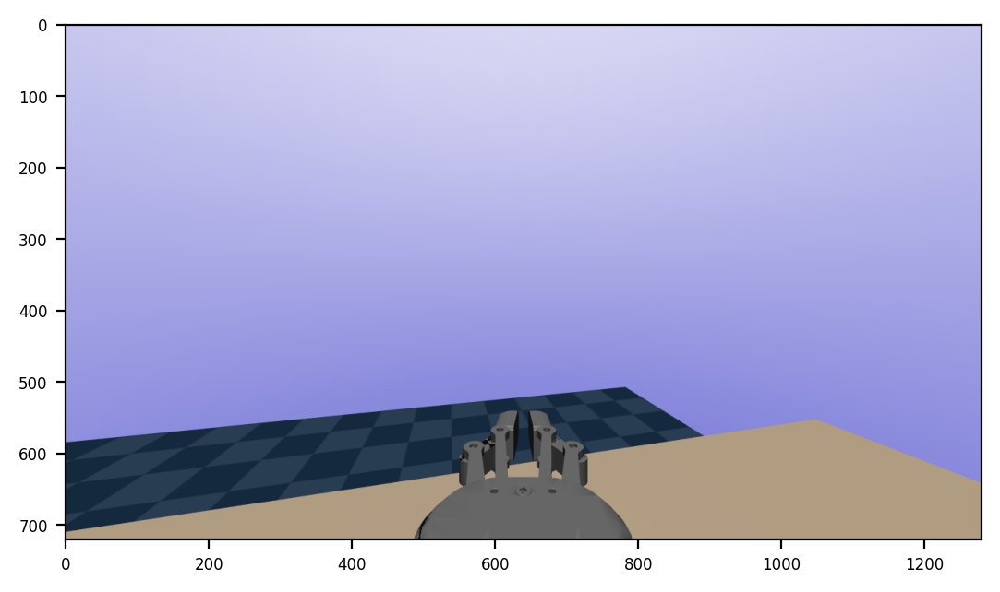

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.97 -0.01  0.23  1.  ]
 [-0.23 -0.01  0.97  0.06]
 [-0.01 -1.   -0.01  0.88]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.97 -0.23 -0.01 -0.78]
 [-0.01 -0.01 -1.    0.1 ]
 [ 0.23  0.97 -0.01 -0.25]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


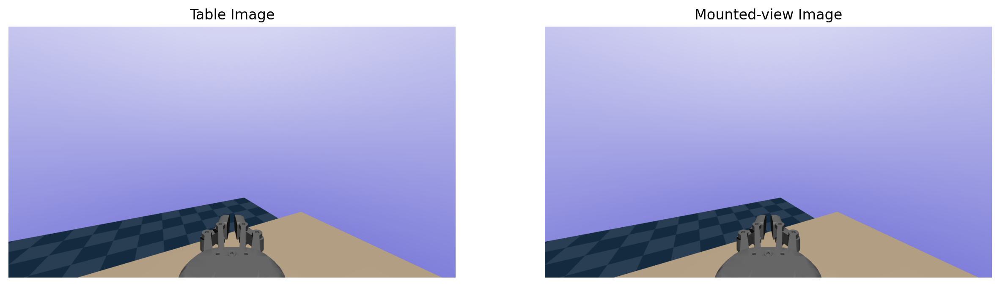

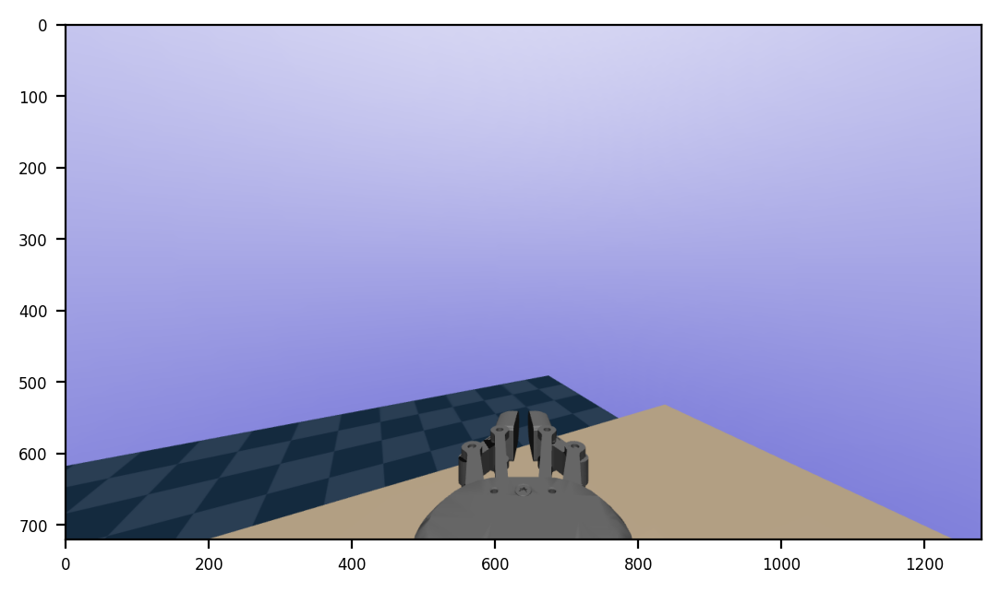

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.89 -0.02  0.45  0.95]
 [-0.45 -0.04  0.89 -0.05]
 [-0.   -1.   -0.05  0.98]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.89 -0.45 -0.   -0.72]
 [-0.02 -0.04 -1.    0.21]
 [ 0.45  0.89 -0.05 -0.29]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


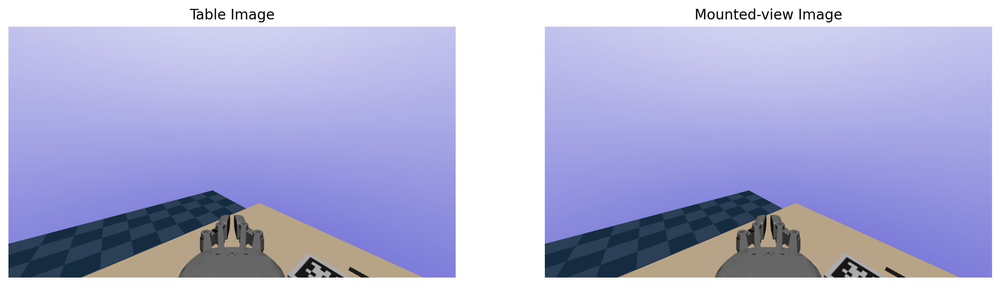

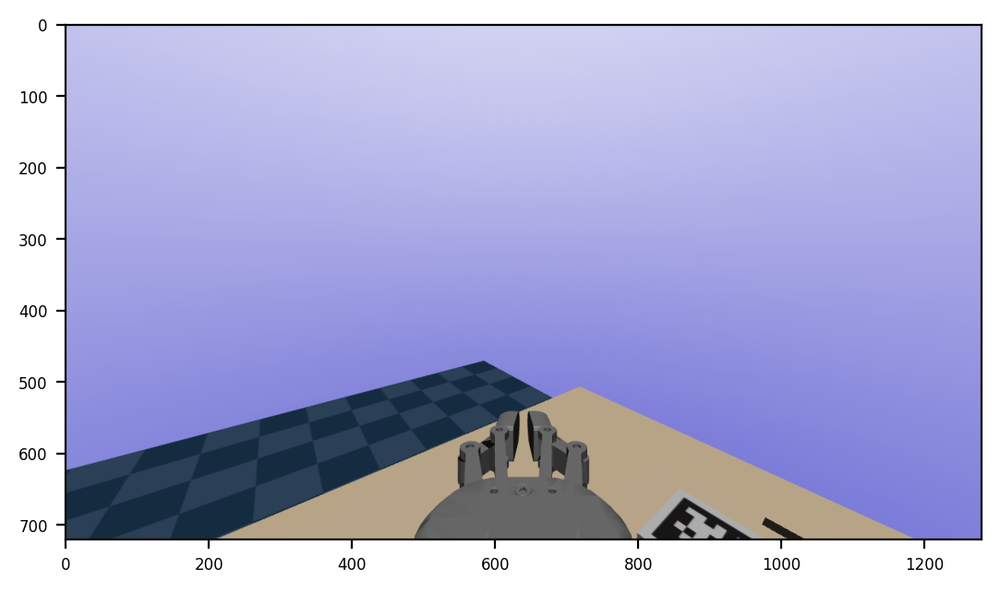

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.78 -0.06  0.63  0.88]
 [-0.63 -0.09  0.77 -0.14]
 [ 0.01 -0.99 -0.11  1.06]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.78 -0.63  0.01 -0.64]
 [-0.06 -0.09 -0.99  0.3 ]
 [ 0.63  0.77 -0.11 -0.3 ]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


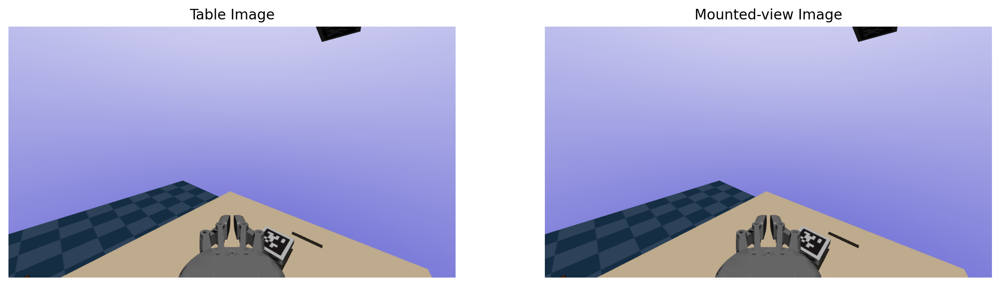

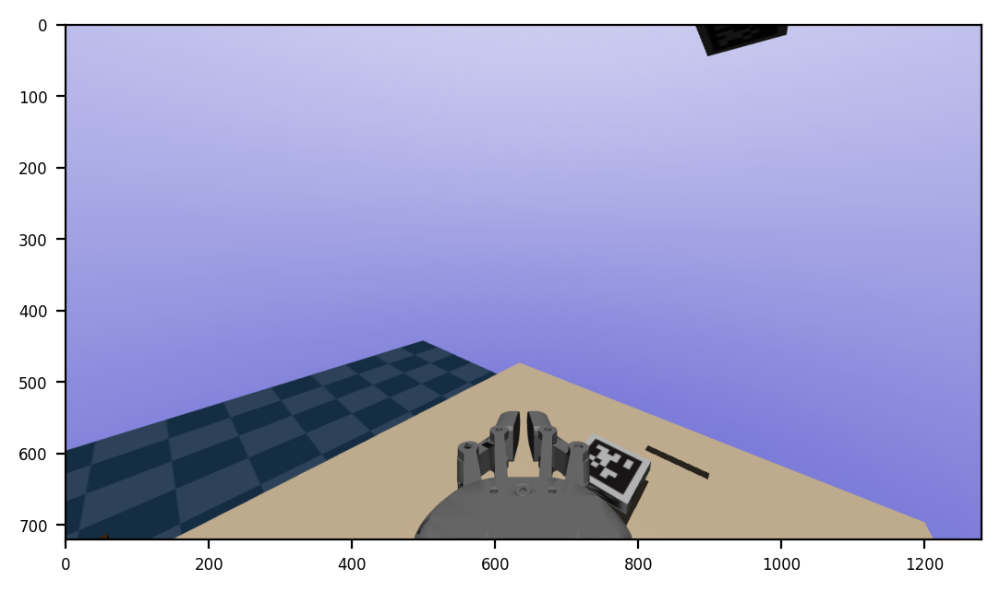

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.63 -0.13  0.76  0.78]
 [-0.77 -0.14  0.62 -0.21]
 [ 0.03 -0.98 -0.19  1.13]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.63 -0.77  0.03 -0.55]
 [-0.13 -0.14 -0.98  0.38]
 [ 0.76  0.62 -0.19 -0.27]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


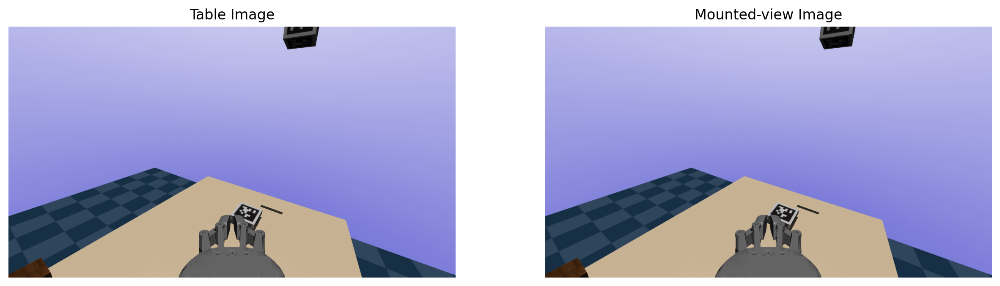

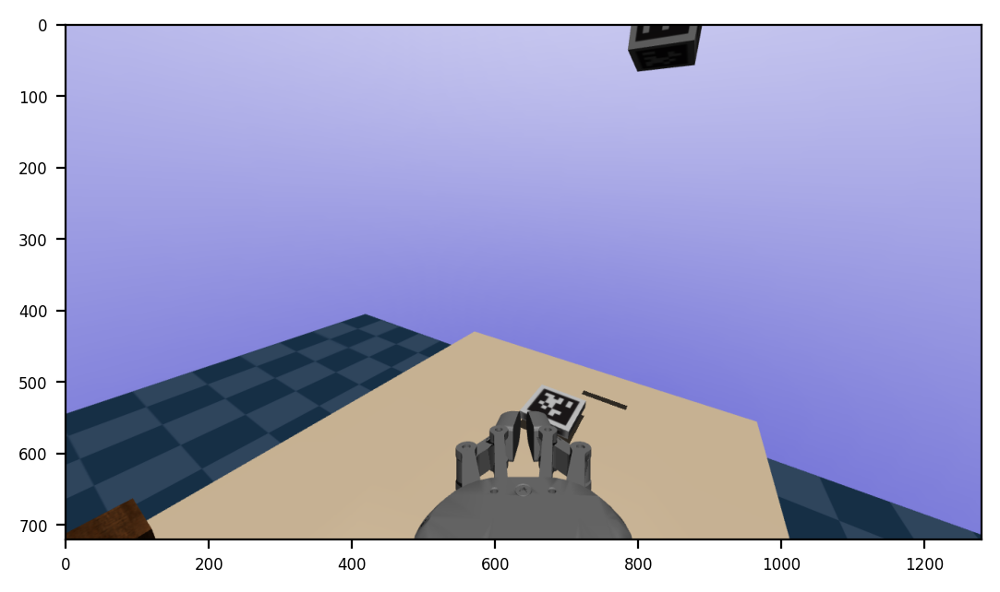

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.48 -0.22  0.85  0.67]
 [-0.88 -0.19  0.45 -0.23]
 [ 0.06 -0.96 -0.28  1.18]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.48 -0.88  0.06 -0.46]
 [-0.22 -0.19 -0.96  0.44]
 [ 0.85  0.45 -0.28 -0.21]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


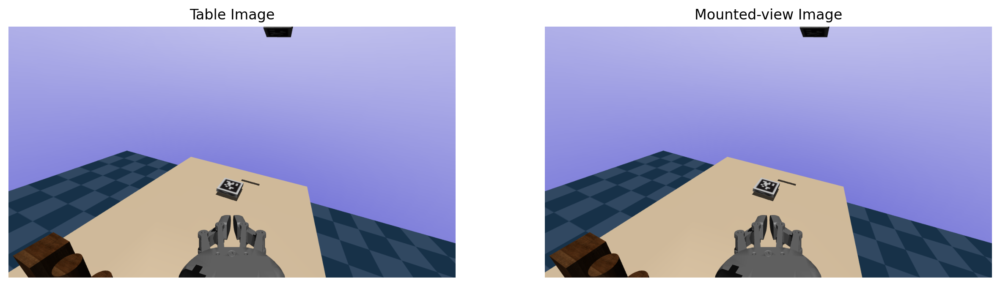

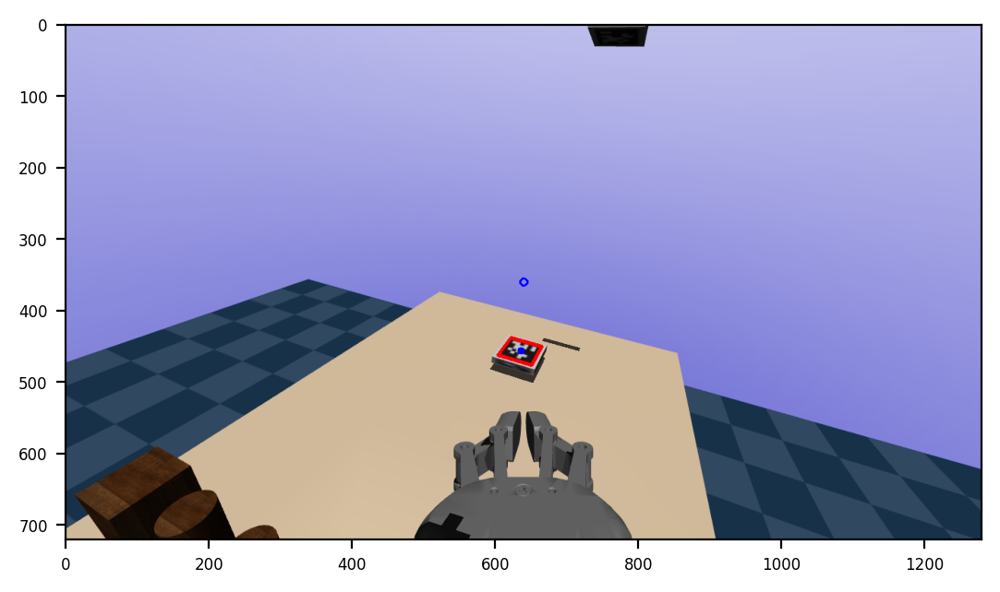

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.33 -0.33  0.88  0.57]
 [-0.94 -0.21  0.27 -0.22]
 [ 0.1  -0.92 -0.38  1.21]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.33 -0.94  0.1  -0.38]
 [-0.33 -0.21 -0.92  0.47]
 [ 0.88  0.27 -0.38 -0.12]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


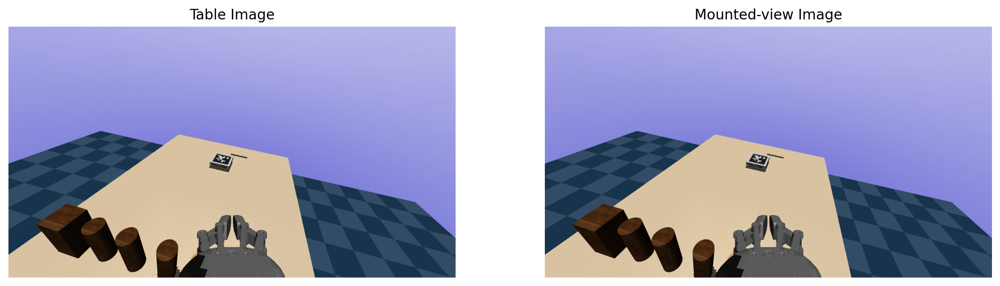

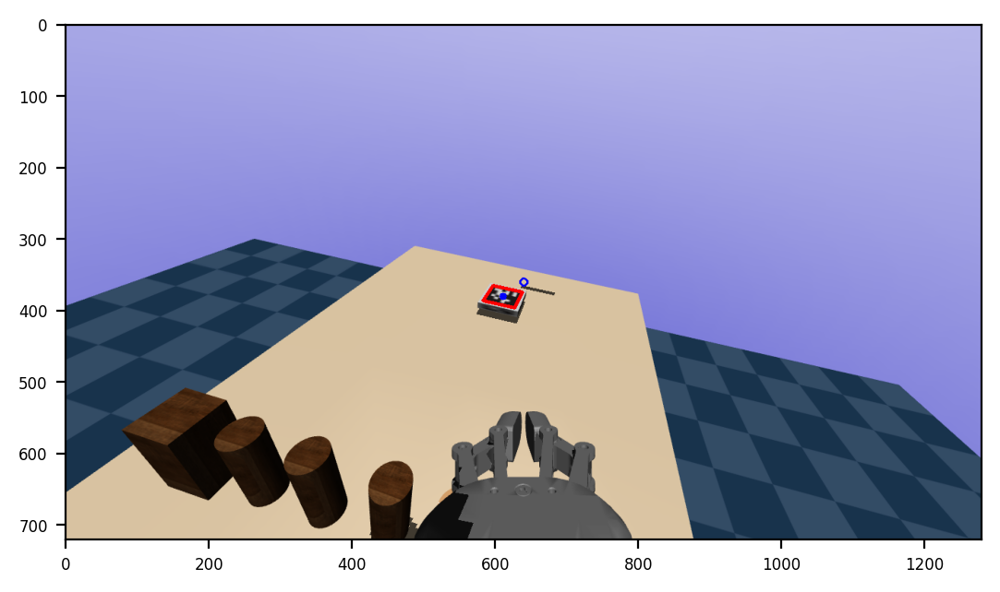

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.21 -0.46  0.86  0.47]
 [-0.97 -0.21  0.12 -0.18]
 [ 0.13 -0.86 -0.49  1.22]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.21 -0.97  0.13 -0.29]
 [-0.46 -0.21 -0.86  0.47]
 [ 0.86  0.12 -0.49 -0.02]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


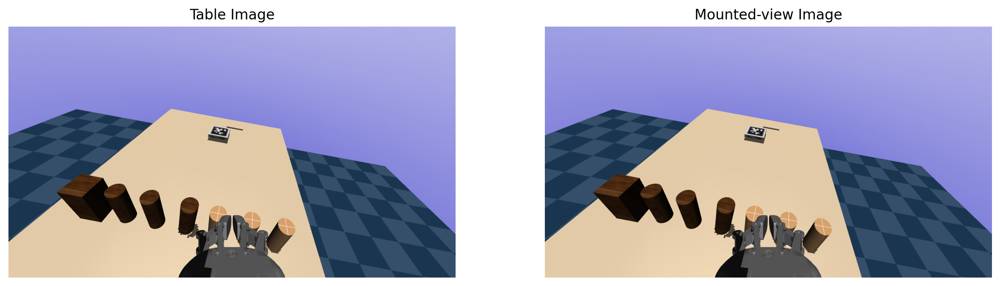

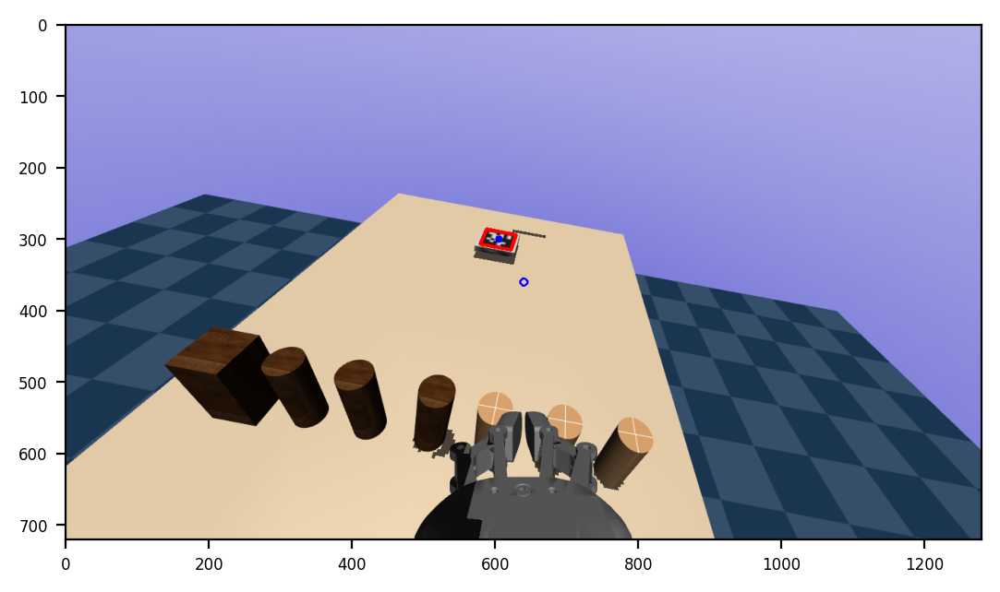

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.12 -0.59  0.8   0.4 ]
 [-0.98 -0.18  0.01 -0.13]
 [ 0.14 -0.78 -0.6   1.2 ]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.12 -0.98  0.14 -0.21]
 [-0.59 -0.18 -0.78  0.43]
 [ 0.8   0.01 -0.6   0.07]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


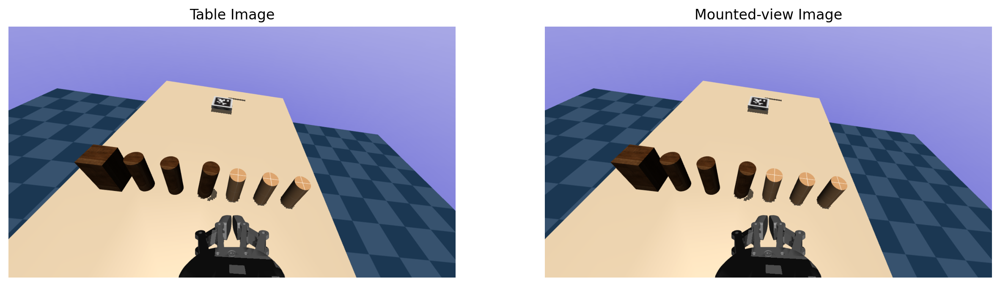

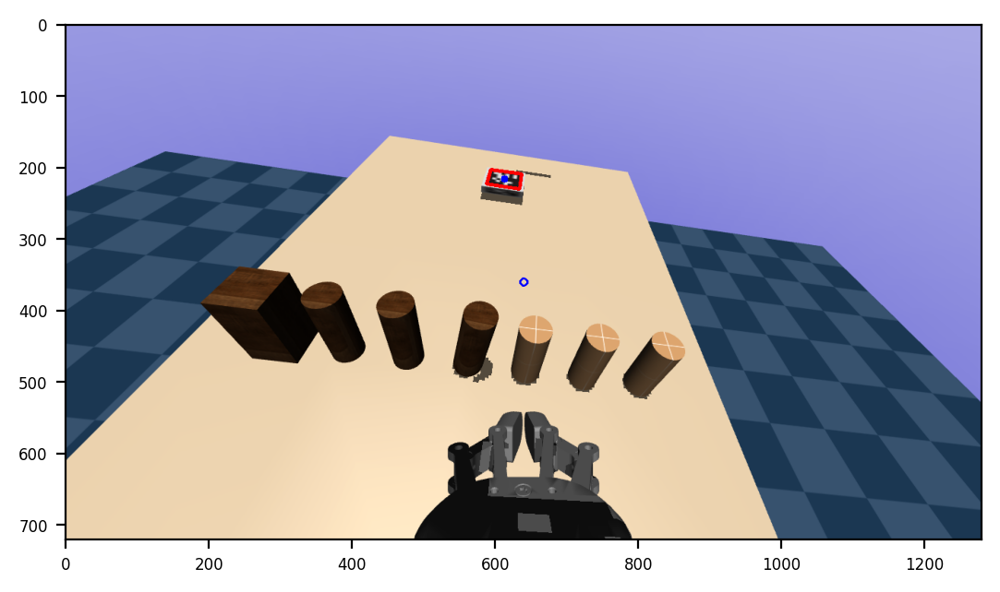

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.06 -0.7   0.71  0.36]
 [-0.99 -0.13 -0.05 -0.06]
 [ 0.13 -0.7  -0.7   1.17]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.06 -0.99  0.13 -0.12]
 [-0.7  -0.13 -0.7   0.38]
 [ 0.71 -0.05 -0.7   0.13]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


In [27]:
import math

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects

for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

file_name = 0
max_tick = 10
env.tick = 0

init_configurations = [0, 0, 0, 0, 0, 0]
set_env_joint_configuration(env, init_configurations, prefix='ur_')

# Extrinsic calbration list
tagpose_list = []
bs2ee_list = []

# update object, robot configurations
env.step()

while env.tick < max_tick:
    # Set Joint Configurations
    init_configurations = [-math.pi/2*0.1*env.tick, -3*math.pi/4*0.1*env.tick, 3*math.pi/4*0.1*env.tick, math.pi/2*0.1*env.tick, math.pi/4*0.1*env.tick, -math.pi/2*0.1*env.tick ]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)
    

    # Get pose what I want to attach on.
    # p_eef = env.get_p_body("ur_rg2_gripper_base_link")
    env.sim_state = env.sim.get_state()
    p_eef = np.array(env.sim.data.body_xpos[env.body_name2idx("ur_rg2_gripper_base_link")])    
    R_eef = env.get_R_body("ur_rg2_gripper_base_link")

    R_y = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,1,0]))
    axis_len = 0.17
    p_y = p_eef - R_y[:,2]*axis_len/2

    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))

    env.add_marker_sphere(p=p_eef,radius=0.03,rgba=[1.0,1.0,1.0,1.0],label='camera')

    env.viewer.add_marker(
        pos   = p_eef,
        type  = mujoco_py.generated.const.GEOM_CYLINDER,
        size  = [0.01,0.01,0.5/2],
        mat   = R_y,
        rgba  = [0.0,1.0,0.0,0.9],
        label = ''
    )

    R_z_rpy = np.degrees(r2rpy(R_z))
    
    # Arbitrary offset on camera btw arm.
    # arbi_offset = [0.05, 0, 0.10]
    arbi_offset = [0.0, 0.0, 0.0]

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")

    # Follow Robot wrist #3.
    cam_infos = env.set_cam_infos(cam_distance  = 0.0,
                        cam_azimuth   = R_z_rpy[2]-90,        # Z-axis: Yaw
                        cam_elevation = -R_z_rpy[0]+90,      # X-axis: Roll                        
                        cam_lookat    = p_eef)  # arbitrary offset on camera.

    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    T_april = get_apriltag_pose(env, img, img_real)
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)
    
    tagpose_list.append(T_april)
    bs2ee_list.append(bs2ee_matrix)
    
    file_name += 1
    get_calibration_data(env, img, img_depth, from_link='ur_rg2_gripper_base_link', to_link='ur_base_link', file_name=file_name, verbose=True)
    
    # delete all the markers.
    del env.viewer._markers[:]


In [7]:
def get_calibration_data(env, img, img_depth, from_link='ur_rg2_gripper_base_link', to_link='ur_base_link', file_name=None, verbose=True):
    # Get matrix A.
    # Transformation matrix about 'camera to target'.
    tagpose, img = get_apriltag_pose(env, img, img_depth)

    plt.imshow(img)
    plt.show()

    if tagpose is not None:    
        R_cam2target = tagpose[:3, :3]
        p_cam2target = tagpose[:3, 3]

        # inverse of T_cam2target matrix
        p_target2cam = -np.linalg.inv(R_cam2target) @ p_cam2target
        R_target2cam = np.linalg.inv(R_cam2target)
        T_target2cam = cv2.hconcat((R_target2cam, p_target2cam))      # 3x4
        T_target2cam = np.vstack((T_target2cam, np.array([0,0,0,1])))   # 4x4

    # Get matrix B.
    # Transformation matrix about 'ee to base'.
    T_ee2bs = get_homogeneous_matrix(env, from_link=from_link, to_link=to_link, verbose=True)
    R_ee2bs = T_ee2bs[:3, :3]
    p_ee2bs = T_ee2bs[:3, 3]

    if tagpose is not None and verbose == True:    
        print(T_target2cam)
        print(T_ee2bs)

    if tagpose is not None:
        np.save(f'./data/20230215/R_ee2bs_{file_name}.npy', R_ee2bs)
        np.save(f'./data/20230215/p_ee2bs_{file_name}.npy', p_ee2bs)
        np.save(f'./data/20230215/R_target2cam_{file_name}.npy', R_target2cam)
        np.save(f'./data/20230215/p_target2cam_{file_name}.npy', p_target2cam)
        print("data saved completely.")
    else:
        print("data doesn't saved.")


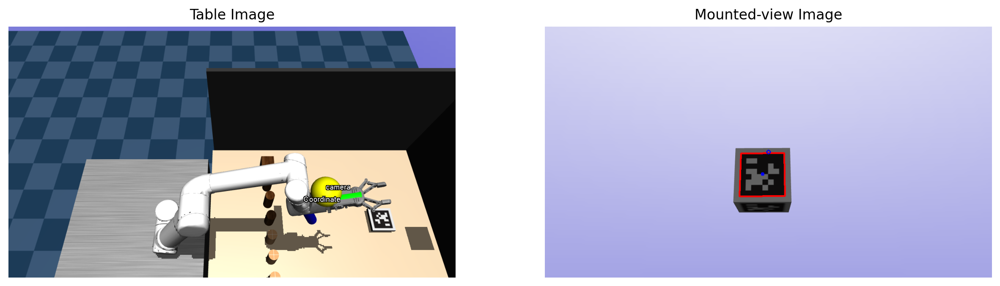

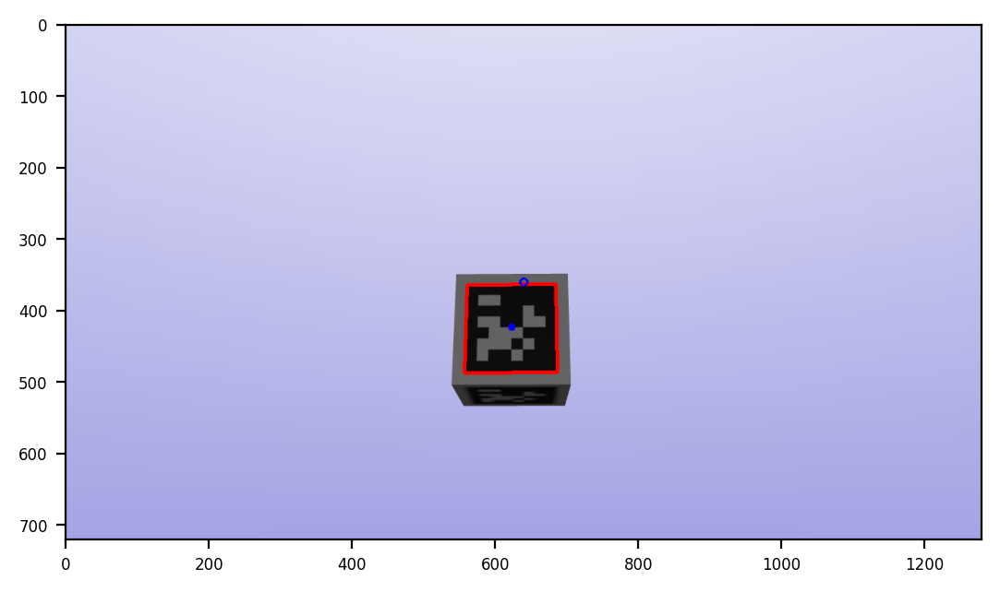

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.84]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.34]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.27]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


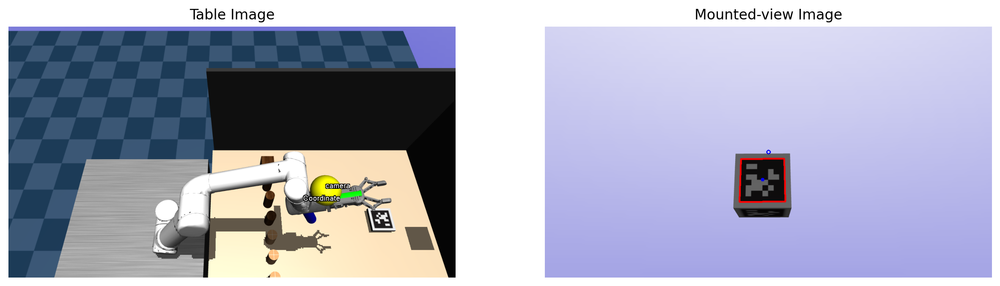

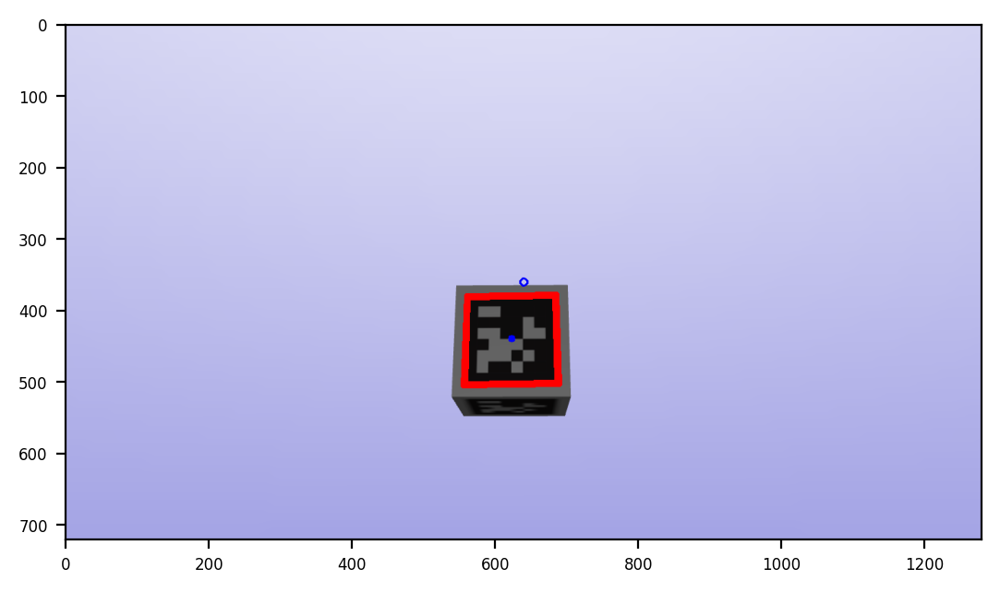

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.83]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.35]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.29]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.93  0.37 -0.23]
 [ 1.   -0.02 -0.03  0.08]
 [ 0.03  0.37  0.93 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.29]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
data saved completely.


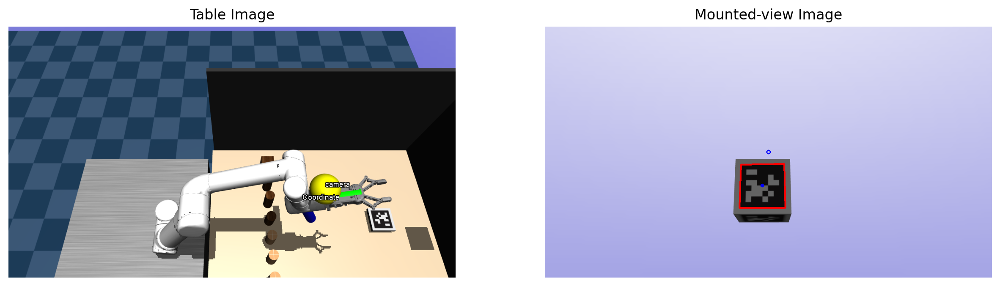

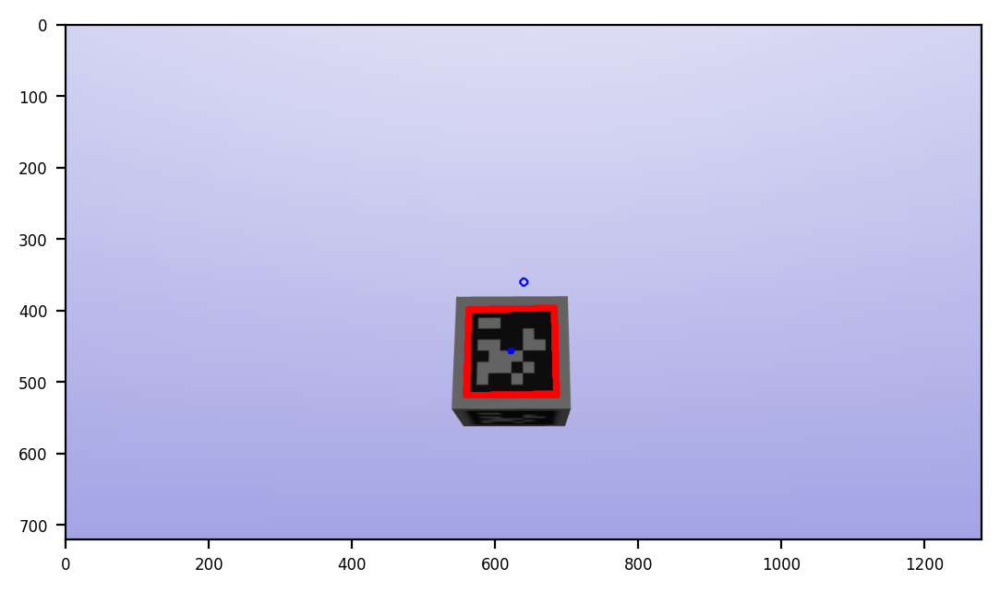

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.83]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.36]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.3 ]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.94  0.35 -0.22]
 [ 1.   -0.03 -0.06  0.11]
 [ 0.07  0.35  0.94 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.3 ]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
data saved completely.


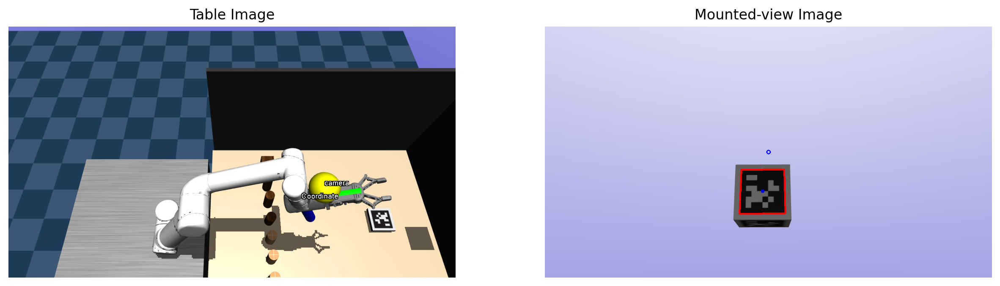

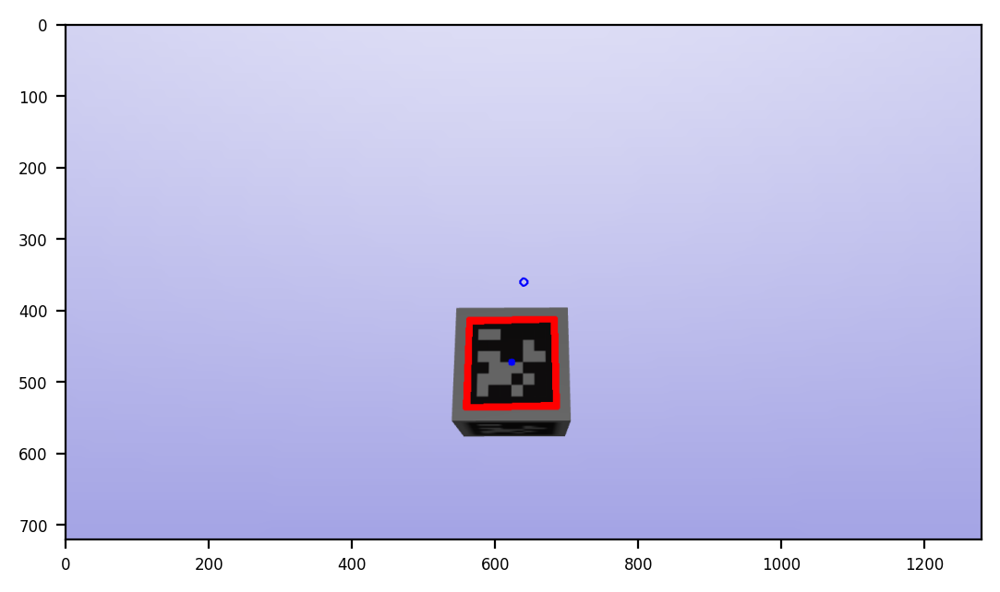

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.82]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.37]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.31]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
[[-3.17e-04 -9.40e-01  3.42e-01 -2.12e-01]
 [ 9.97e-01 -2.82e-02 -7.66e-02  1.35e-01]
 [ 8.16e-02  3.41e-01  9.37e-01 -6.11e-01]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.31]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
data saved completely.


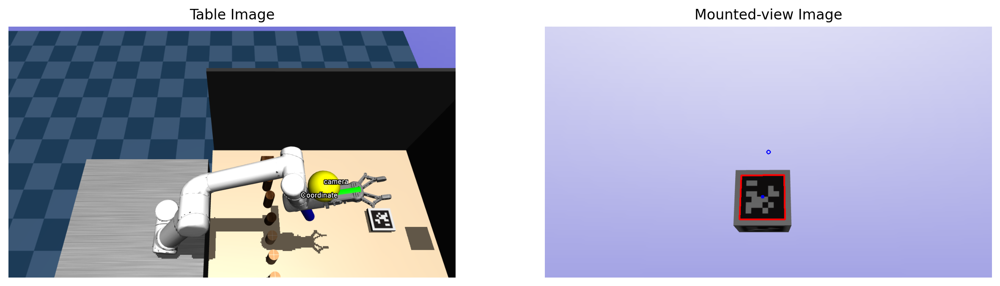

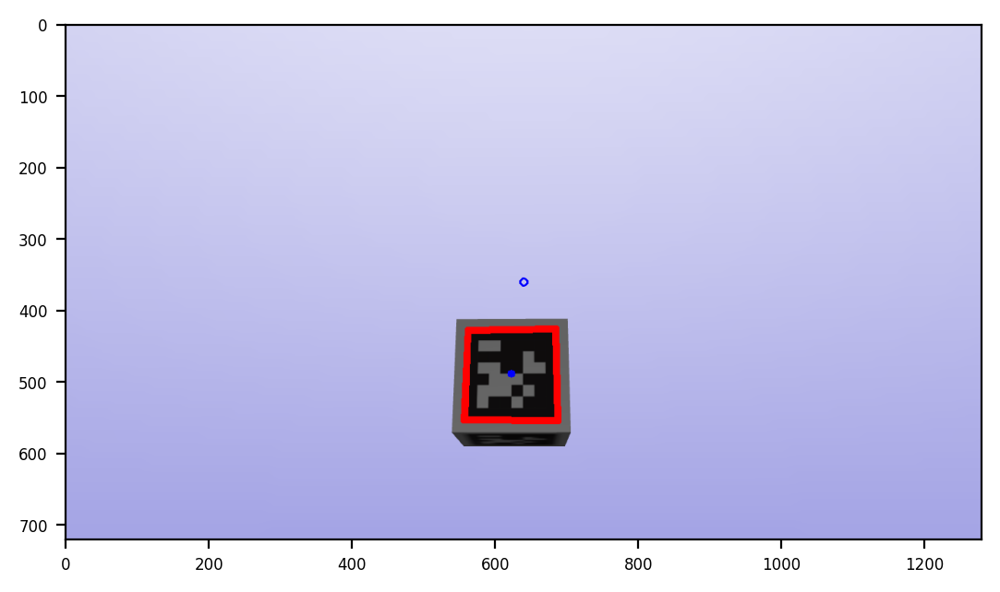

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.82]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.38]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.32]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -0.95  0.33 -0.2 ]
 [ 1.   -0.02 -0.07  0.14]
 [ 0.07  0.32  0.94 -0.62]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.32]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
data saved completely.


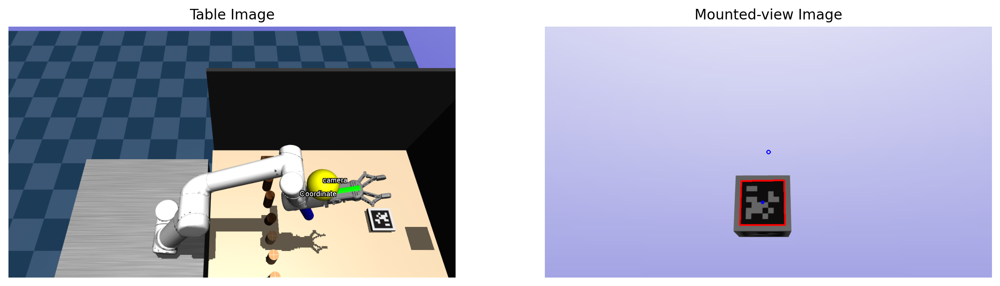

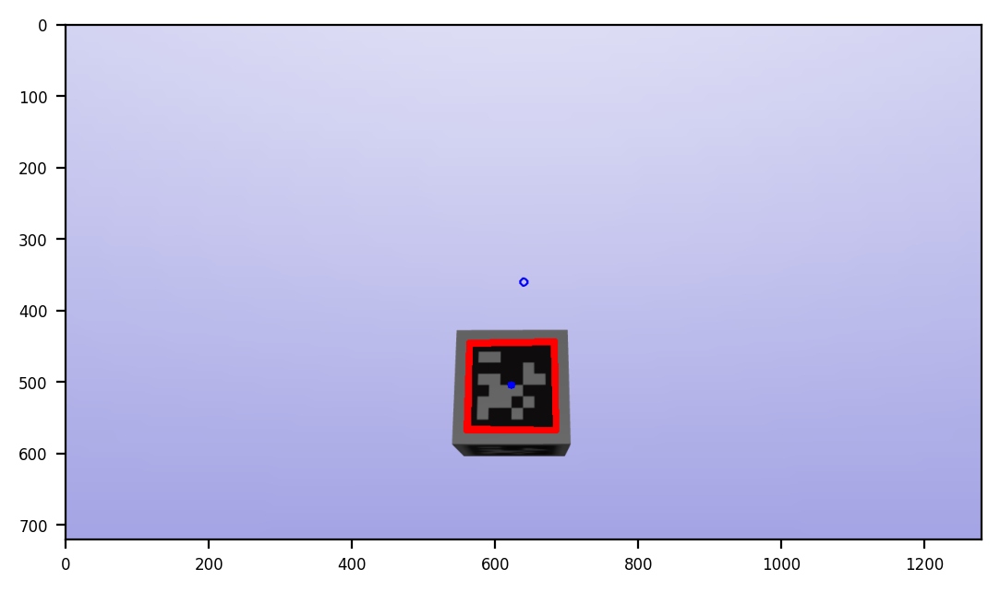

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.81]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.39]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.34]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
[[ 4.42e-04 -9.60e-01  2.82e-01 -1.72e-01]
 [ 9.96e-01 -2.62e-02 -9.09e-02  1.69e-01]
 [ 9.46e-02  2.80e-01  9.55e-01 -6.22e-01]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.34]
 [ 0.93  0.01  0.36 -0.81]
 [ 0.    0.    0.    1.  ]]
data saved completely.


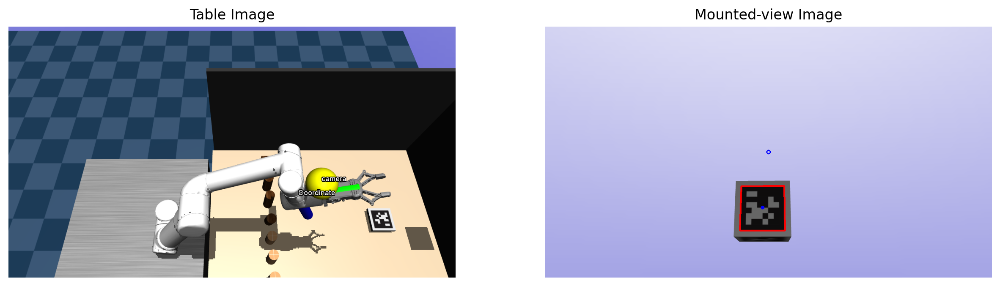

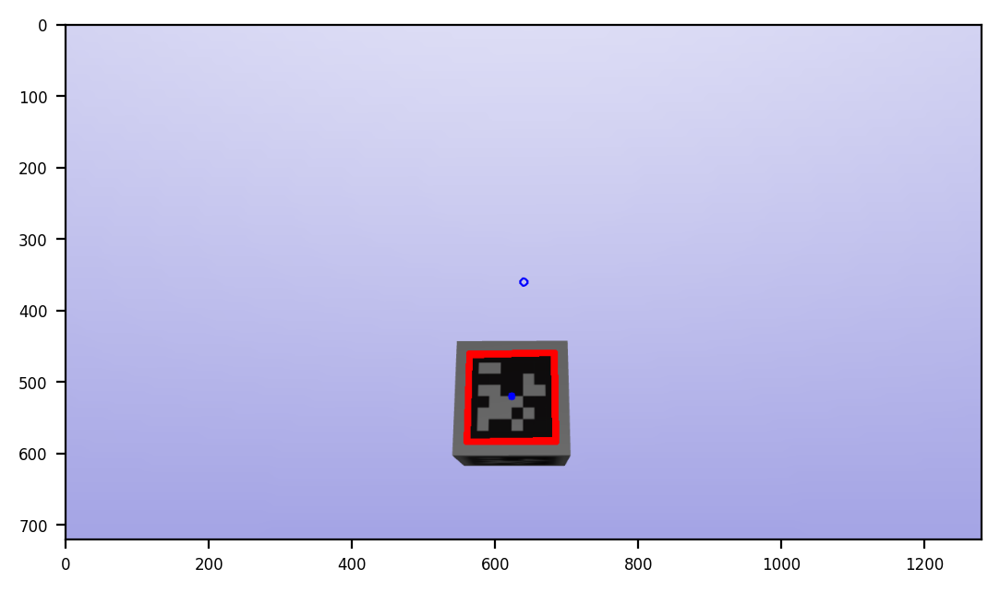

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.8 ]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.41]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.35]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
[[-0.01 -0.95  0.33 -0.2 ]
 [ 1.   -0.03 -0.07  0.17]
 [ 0.07  0.32  0.94 -0.62]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.35]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
data saved completely.


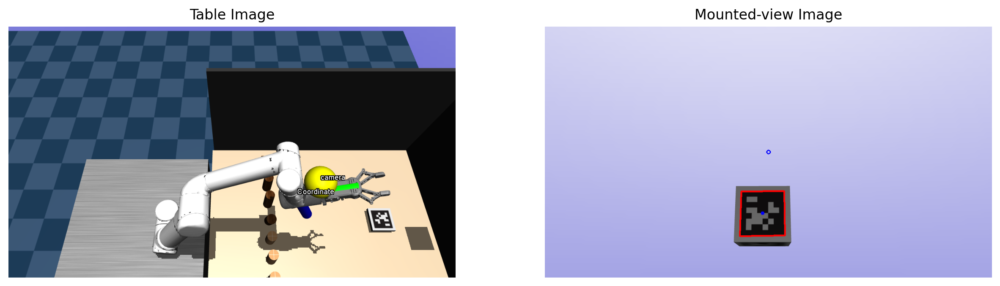

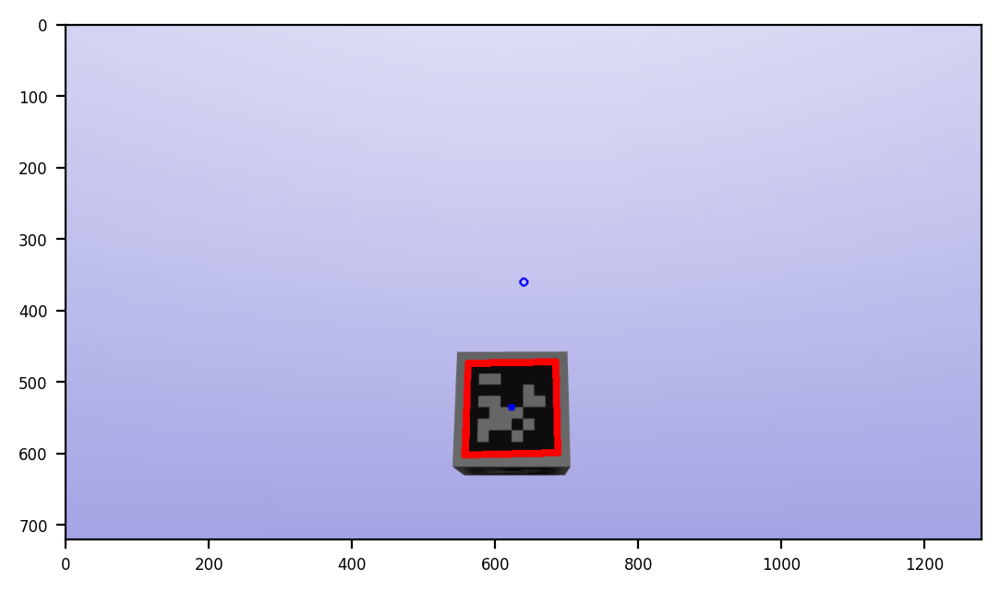

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.8 ]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.42]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.36]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.93  0.35 -0.22]
 [ 1.   -0.03 -0.06  0.17]
 [ 0.07  0.35  0.93 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.36]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
data saved completely.


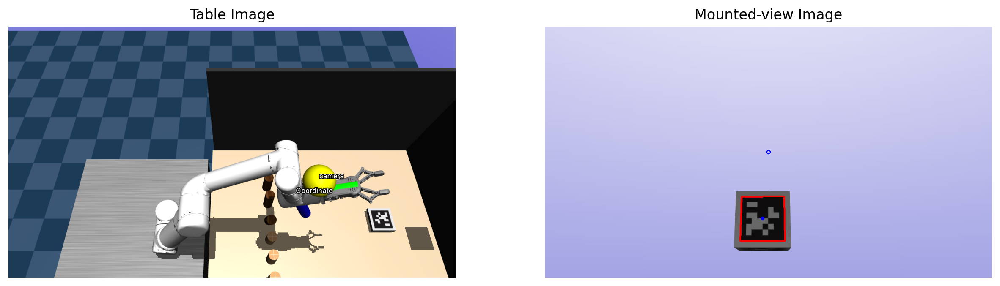

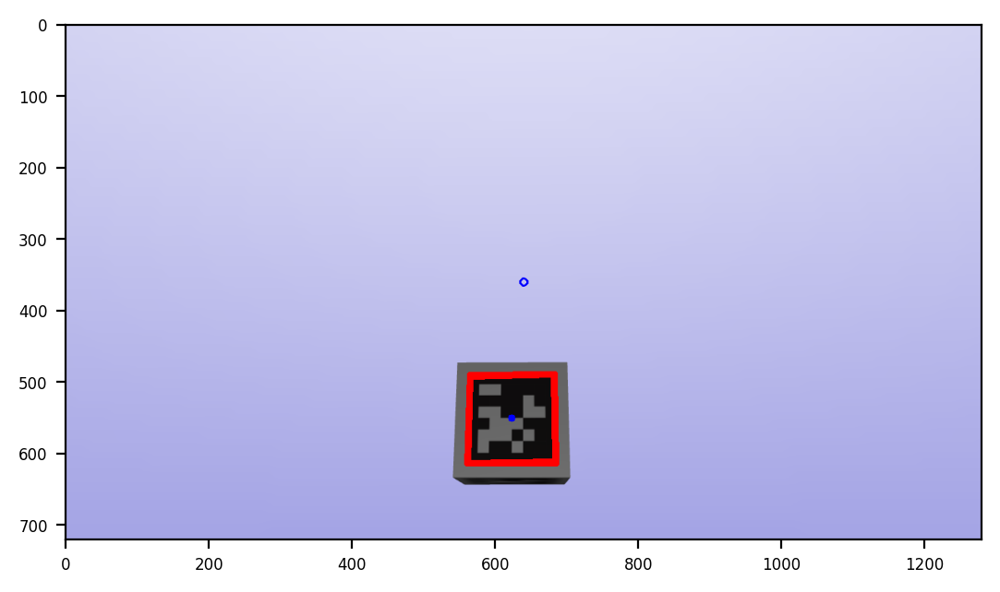

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.79]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.43]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.37]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
[[-0.01 -0.94  0.35 -0.22]
 [ 1.   -0.03 -0.07  0.19]
 [ 0.08  0.34  0.94 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.37]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
data saved completely.


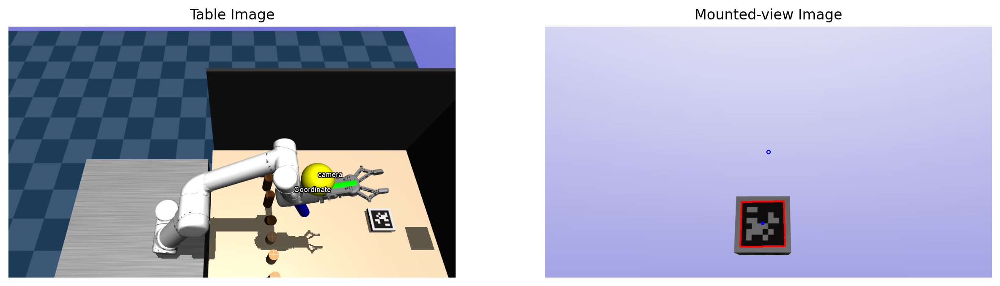

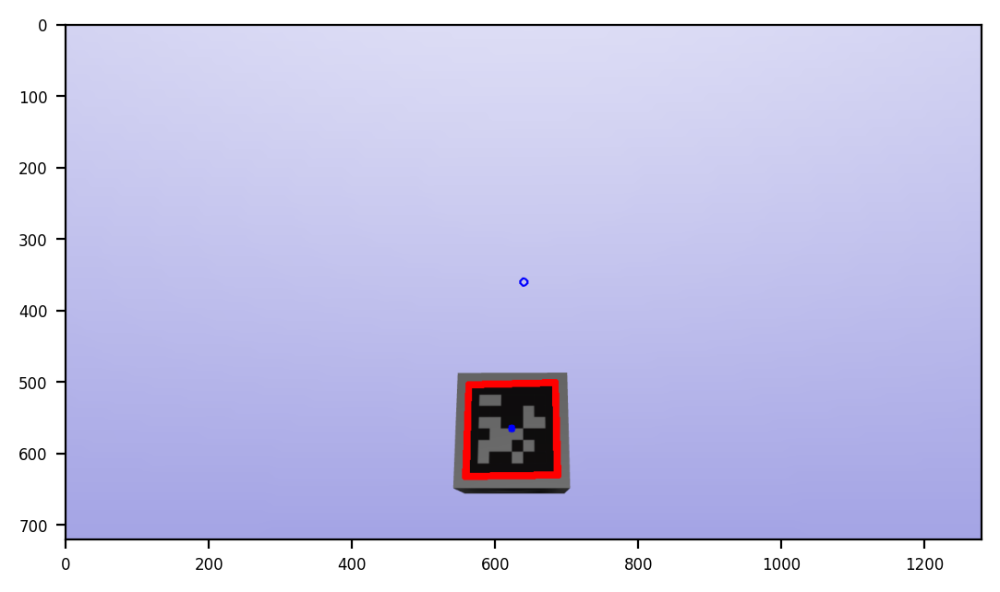

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.78]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.44]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.38]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.94  0.35 -0.22]
 [ 0.99 -0.04 -0.09  0.22]
 [ 0.1   0.35  0.93 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.38]
 [ 0.93  0.01  0.36 -0.8 ]
 [ 0.    0.    0.    1.  ]]
data saved completely.


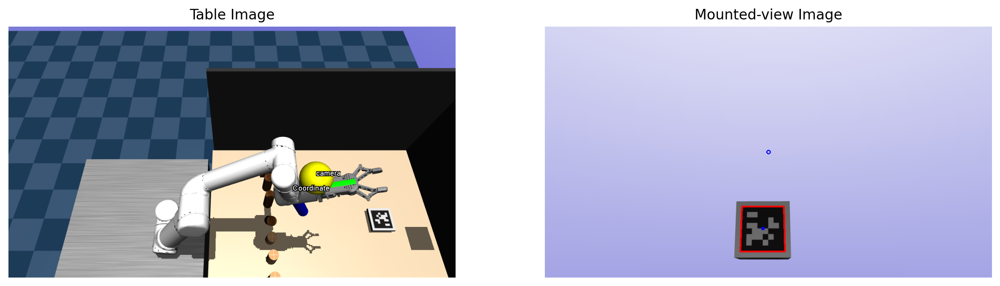

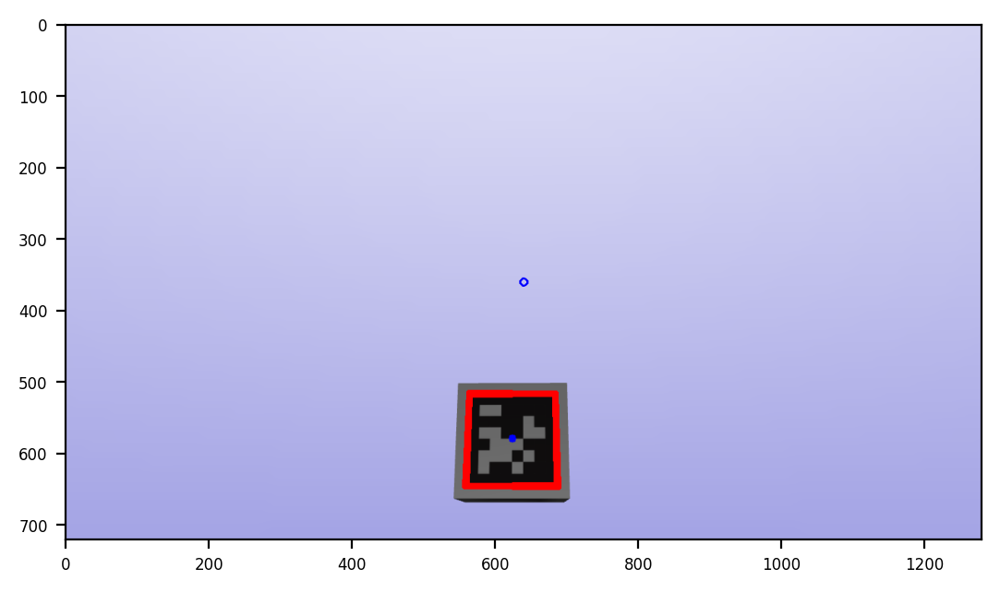

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.78]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.45]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.39]
 [ 0.93  0.01  0.36 -0.79]
 [ 0.    0.    0.    1.  ]]
[[ 0.   -0.94  0.33 -0.21]
 [ 1.   -0.01 -0.03  0.19]
 [ 0.03  0.33  0.94 -0.63]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.39]
 [ 0.93  0.01  0.36 -0.79]
 [ 0.    0.    0.    1.  ]]
data saved completely.


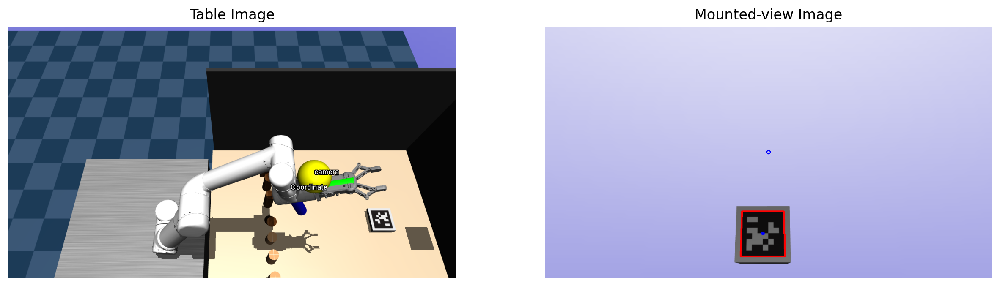

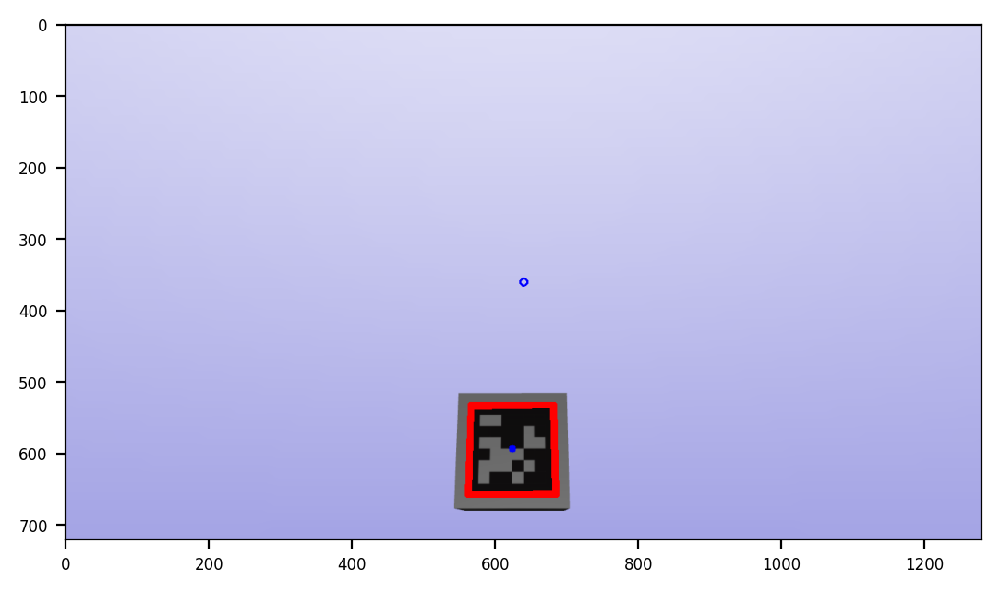

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.77]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.46]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.41]
 [ 0.93  0.01  0.36 -0.79]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.94  0.34 -0.22]
 [ 0.99 -0.05 -0.12  0.26]
 [ 0.12  0.33  0.93 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.41]
 [ 0.93  0.01  0.36 -0.79]
 [ 0.    0.    0.    1.  ]]
data saved completely.


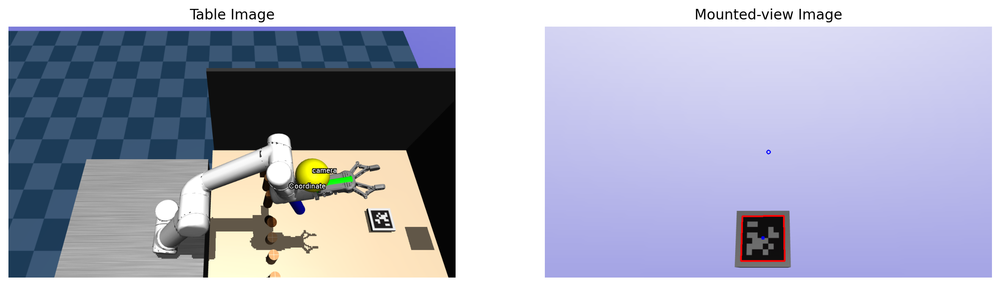

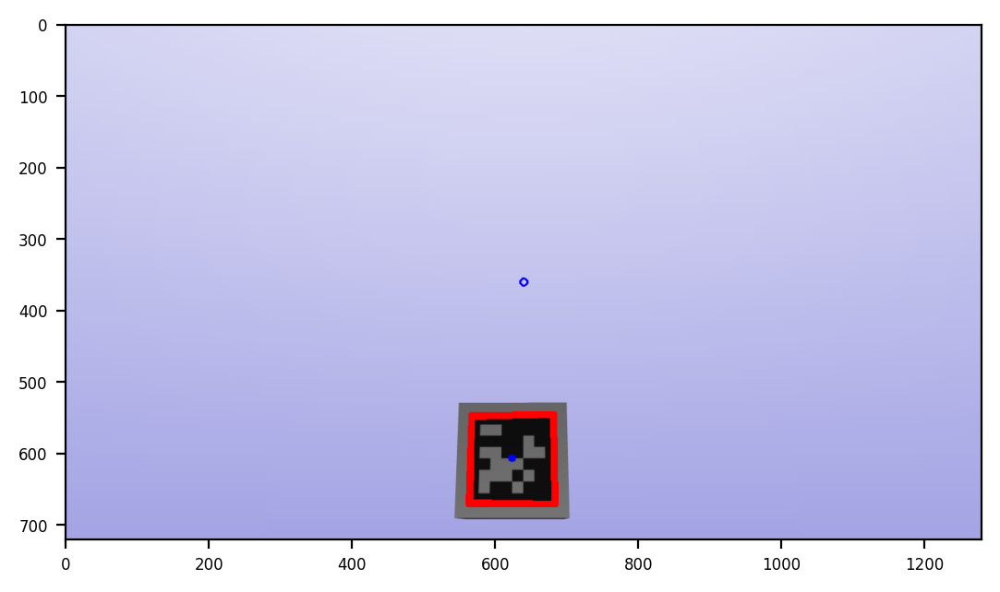

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.76]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.47]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.42]
 [ 0.93  0.01  0.36 -0.79]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.96  0.29 -0.18]
 [ 0.98 -0.05 -0.18  0.31]
 [ 0.18  0.28  0.94 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.42]
 [ 0.93  0.01  0.36 -0.79]
 [ 0.    0.    0.    1.  ]]
data saved completely.


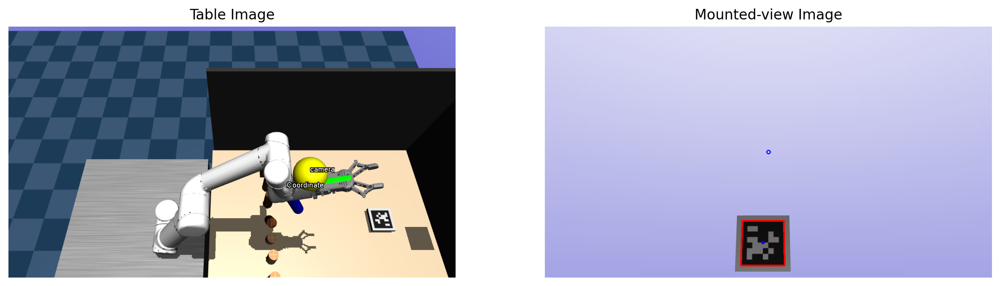

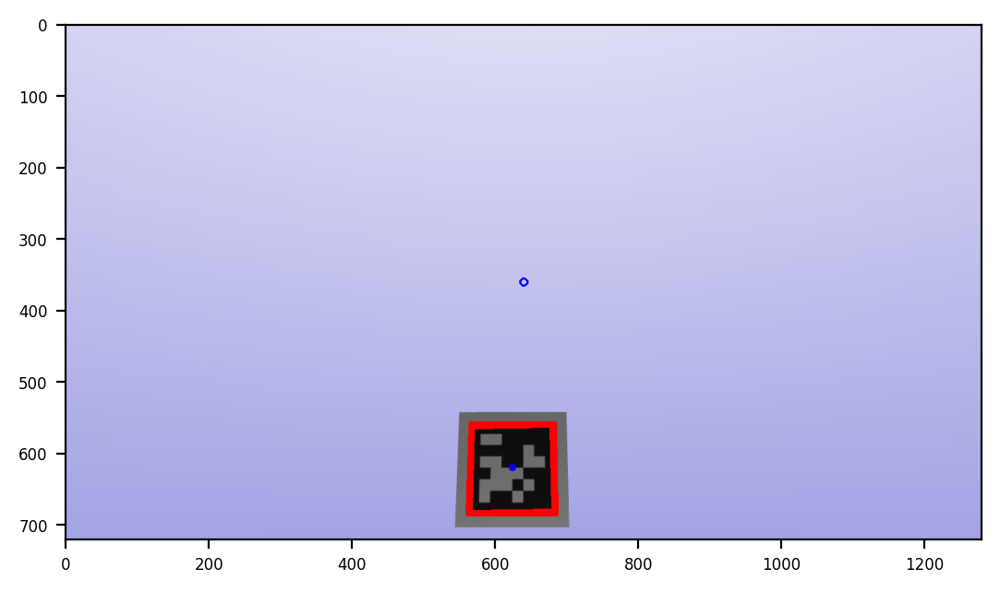

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.75]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.47]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.43]
 [ 0.93  0.01  0.36 -0.78]
 [ 0.    0.    0.    1.  ]]
[[-0.01 -0.93  0.36 -0.24]
 [ 0.99 -0.04 -0.09  0.27]
 [ 0.1   0.36  0.93 -0.62]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.43]
 [ 0.93  0.01  0.36 -0.78]
 [ 0.    0.    0.    1.  ]]
data saved completely.


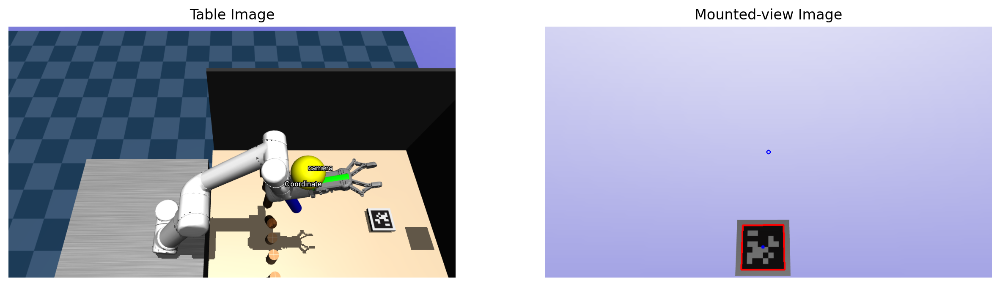

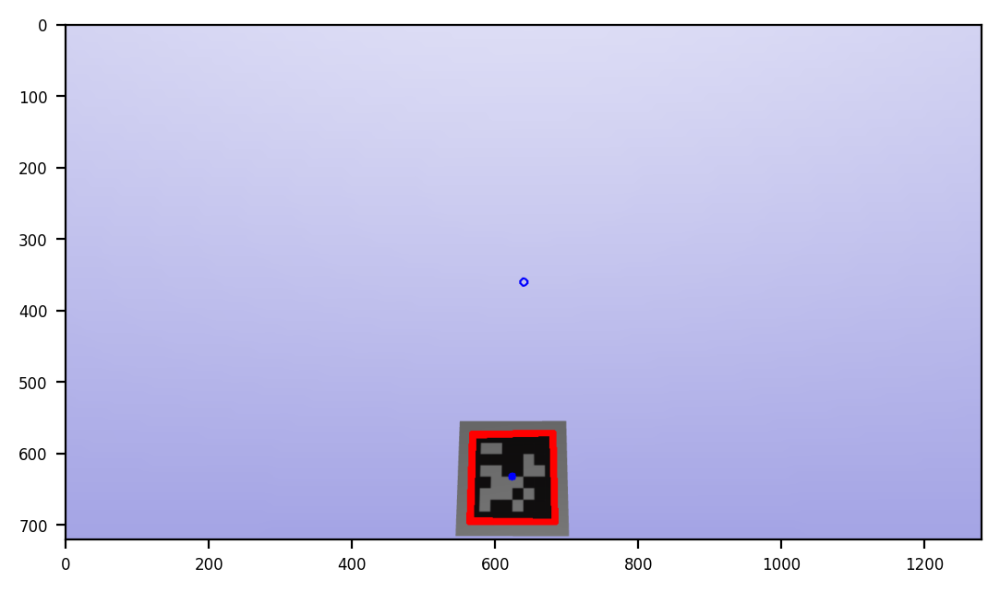

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.74]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.48]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.44]
 [ 0.93  0.01  0.36 -0.78]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.95  0.31 -0.2 ]
 [ 0.98 -0.06 -0.18  0.34]
 [ 0.19  0.3   0.93 -0.61]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.44]
 [ 0.93  0.01  0.36 -0.78]
 [ 0.    0.    0.    1.  ]]
data saved completely.


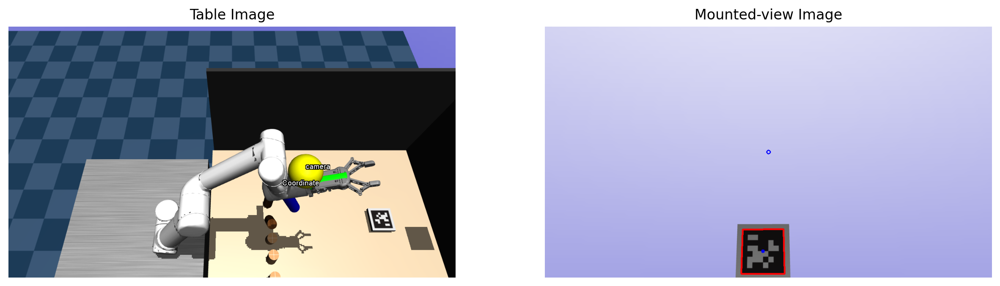

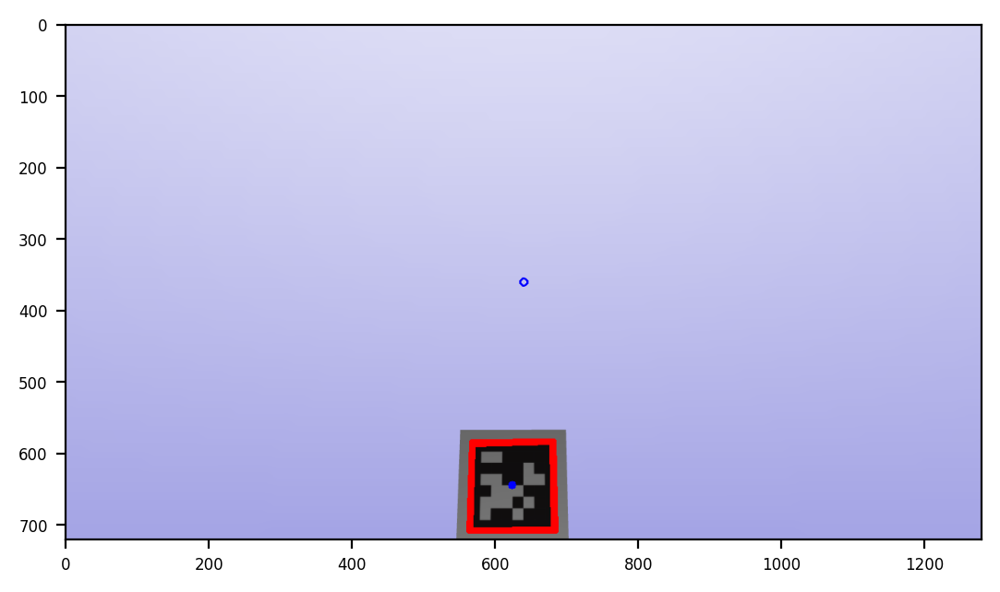

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.74]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.49]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.45]
 [ 0.93  0.01  0.36 -0.77]
 [ 0.    0.    0.    1.  ]]
[[-0.   -0.94  0.35 -0.23]
 [ 0.98 -0.06 -0.16  0.34]
 [ 0.18  0.34  0.92 -0.6 ]
 [ 0.    0.    0.    1.  ]]
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.45]
 [ 0.93  0.01  0.36 -0.77]
 [ 0.    0.    0.    1.  ]]
data saved completely.


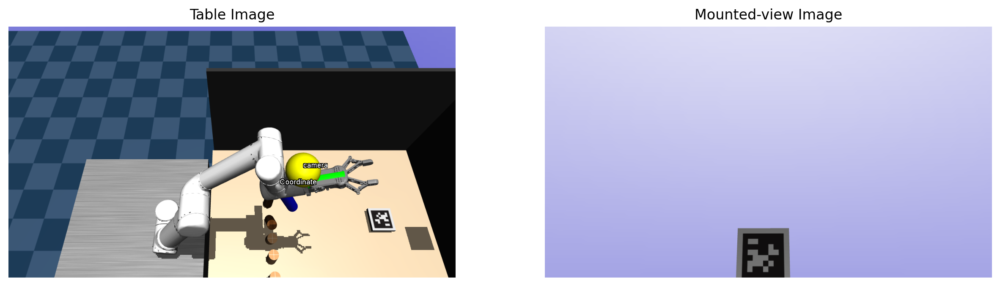

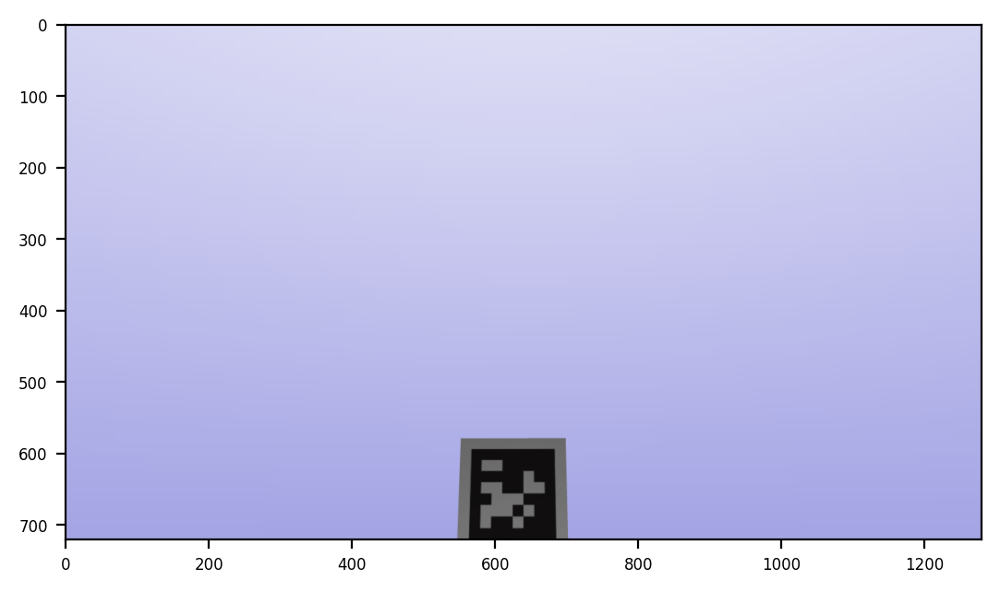

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.73]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.5 ]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.46]
 [ 0.93  0.01  0.36 -0.77]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


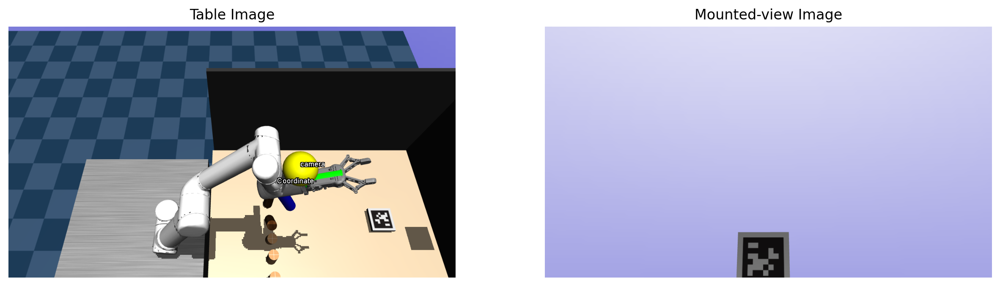

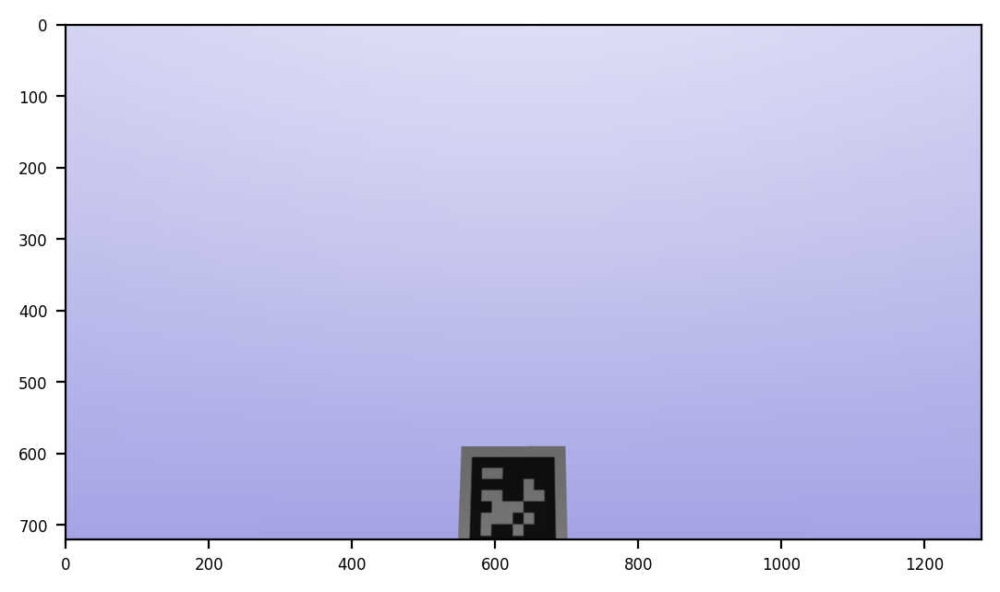

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.72]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.51]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.47]
 [ 0.93  0.01  0.36 -0.76]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


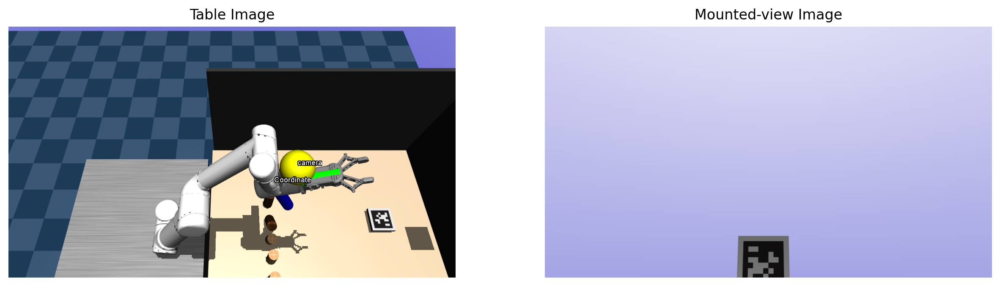

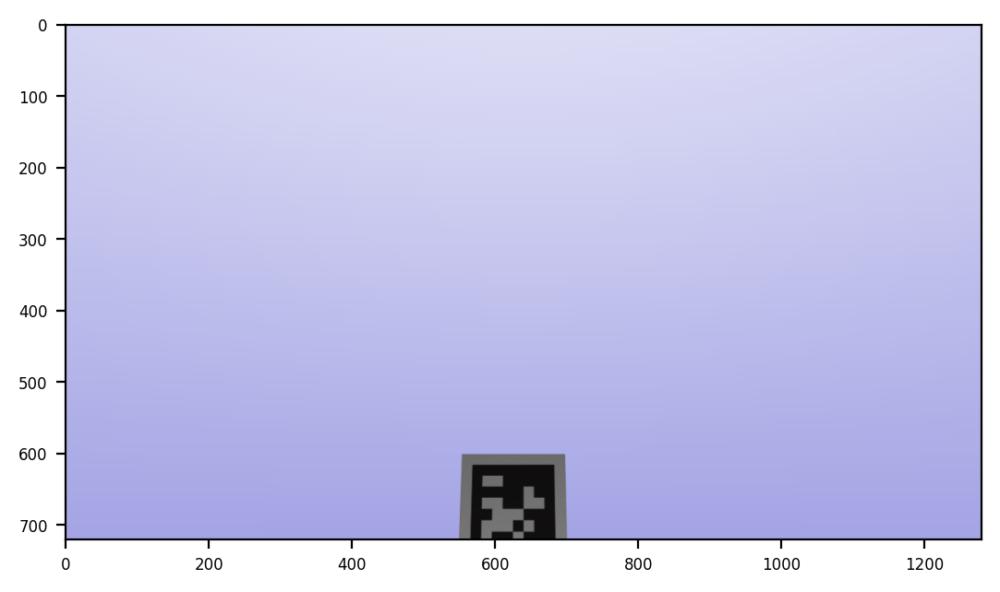

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 0.01  0.36  0.93  0.71]
 [-1.    0.    0.01 -0.11]
 [ 0.   -0.93  0.36  1.52]
 [ 0.    0.    0.    1.  ]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.48]
 [ 0.93  0.01  0.36 -0.75]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


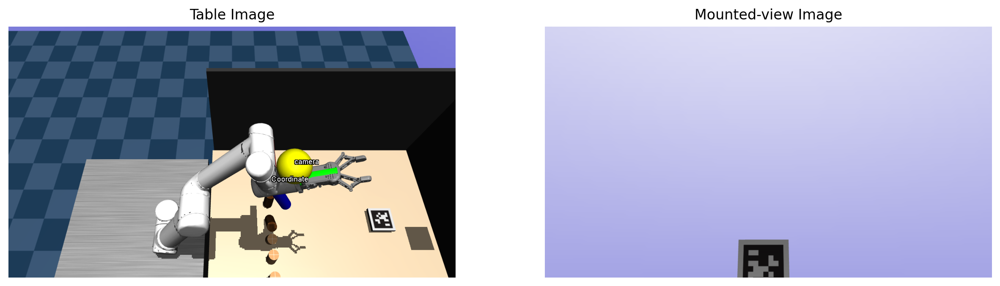

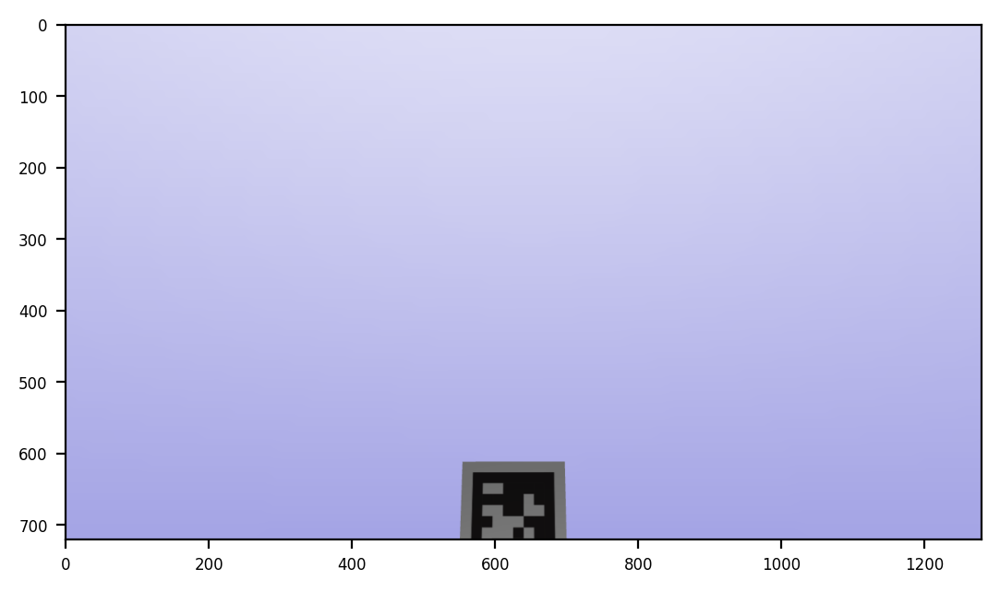

Transformation matrix about 'from link': ur_rg2_gripper_base_link
[[ 1.13e-02  3.64e-01  9.31e-01  6.98e-01]
 [-1.00e+00  1.50e-03  1.15e-02 -1.10e-01]
 [ 2.79e-03 -9.32e-01  3.64e-01  1.52e+00]
 [ 0.00e+00  0.00e+00  0.00e+00  1.00e+00]]
Transformation matrix about 'to link': ur_base_link
[[1.   0.   0.   0.18]
 [0.   1.   0.   0.  ]
 [0.   0.   1.   0.79]
 [0.   0.   0.   1.  ]]
Transformation matrix about 'from2to' link: ur_rg2_gripper_base_link -> ur_base_link
[[ 0.01 -1.    0.   -0.12]
 [ 0.36  0.   -0.93  0.49]
 [ 0.93  0.01  0.36 -0.75]
 [ 0.    0.    0.    1.  ]]
data doesn't saved.


In [49]:
import math

bs2ee_list = []
tagpose_list = []
camera_pos_list = []
p_eef_list = []
cam_infos = []
gt_ext = []

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects
for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

init_configurations = [0, 0, 0, 0, 0, 0]
set_env_joint_configuration(env, init_configurations, prefix='ur_')

# update object, robot configurations
env.step()
env.forward(INCREASE_TICK=False)

file_name = 0
max_tick = 20
env.tick = 0

while env.tick < max_tick:
    # Set Joint Configurations
    init_configurations = [-math.pi, -2.0, -math.pi/4+0.01*env.tick*math.pi, -math.pi-0.01*env.tick*math.pi, -math.pi/2, 0.]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)

    # Get pose what I want to attach on.
    p_eef = env.get_p_body("ur_wrist_3_link")
    R_eef = env.get_R_body("ur_wrist_3_link")
    p_eef_list.append(p_eef)

    axis_len = 0.18

    R_y = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,1,0]))
    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))
    p_z = p_eef - R_z[:,2]*axis_len/2 + R_y[:,2]*axis_len/2

    env.add_marker_sphere(p=p_z,radius=0.05,rgba=[1.0,1.0,0.0,1.0],label='camera')

    # Add viewer coordinate marker.
    env.add_marker_coordinate(
        p=p_eef,R=R_eef,axis_len=0.2,axis_width=0.02,label='Coordinate')

    R_z_rpy = np.degrees(r2rpy(R_z))
    
    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 90,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")

    # Follow Robot end-effector.
    cam_infos = env.set_cam_infos(cam_distance  = -0.00,
                        cam_azimuth   = R_z_rpy[2]+90,        # Z-axis: Yaw
                        cam_elevation = R_z_rpy[0]+180,      # X-axis: Roll                        
                        cam_lookat    = p_z)  # arbitrary offset on camera.

    camera_pos_list.append(cam_infos["cam_lookat"])

    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    detector = apriltag.Detector()
    img_BGR = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    img_Gray = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2GRAY)
    results = detector.detect(img_Gray)
    draw_bbox(results, img, verbose=False)


    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    # Get ground truth data.
    gt_ext.append(cam_infos["cam_lookat"]-env.get_p_body("ur_wrist_3_link"))
    
    # Get matrix A.
    tagpose = get_apriltag_pose(env, img, img_depth)
    tagpose_list.append(tagpose)

    # Get matrix B.
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)
    bs2ee_list.append(bs2ee_matrix)

    get_calibration_data(env, img, img_depth, from_link='ur_rg2_gripper_base_link', to_link='ur_base_link', file_name=file_name, verbose=True)
    file_name += 1

    # delete all the markers.
    del env.viewer._markers[:]

    # img = []
    # cam_infos = []

In [1]:
import mujoco
import mujoco_viewer

model = mujoco.MjModel.from_xml_path('../asset/ur5e/ril_robot.xml')
data = mujoco.MjData(model)
viewer = mujoco_viewer.MujocoViewer(model, data, 'offscreen')
img = viewer.read_pixels(camid=-1)

In [2]:
import matplotlib.pyplot as plt

plt.imshow(img)
plt.show()

In [50]:
import sys
sys.path.append("..")
from util_calibration import get_extrinsic_calibration_frank, get_extrinsic_calibration_tsai

In [55]:
R_ee2bs = [np.load(f"./data/20230215/R_ee2bs_{i}.npy") for i in range(11)]
p_ee2bs = [np.load(f"./data/20230215/p_ee2bs_{i}.npy") for i in range(11)]
R_target2cam = [np.load(f"./data/20230215/R_target2cam_{i}.npy") for i in range(11)]
p_target2cam = [np.load(f"./data/20230215/p_target2cam_{i}.npy") for i in range(11)]


In [56]:
# method: CALIB_HAND_EYE_TSAI CALIB_HAND_EYE_PARK CALIB_HAND_EYE_HORAUD CALIB_HAND_EYE_ANDREFF CALIB_HAND_EYE_DANIILIDIS 

R_ext, p_ext = cv2.calibrateHandEye(R_ee2bs, p_ee2bs, R_target2cam, p_target2cam, method=cv2.CALIB_HAND_EYE_DANIILIDIS)
T_ext = cv2.hconcat((R_ext, p_ext))      # 3x4
T_ext = np.vstack((T_ext, np.array([0,0,0,1])))   # 4x4
T_ext

array([[ 0.74, -0.55, -0.39, -0.08],
       [-0.67, -0.51, -0.55, -0.22],
       [ 0.1 ,  0.67, -0.74,  0.52],
       [ 0.  ,  0.  ,  0.  ,  1.  ]])

In [57]:
cam_infos["cam_lookat"]

array([ 0.67, -0.11,  1.61])

In [58]:
cam_infos["cam_lookat"]-env.get_p_body("ur_wrist_3_link")

array([0.05, 0.  , 0.12])

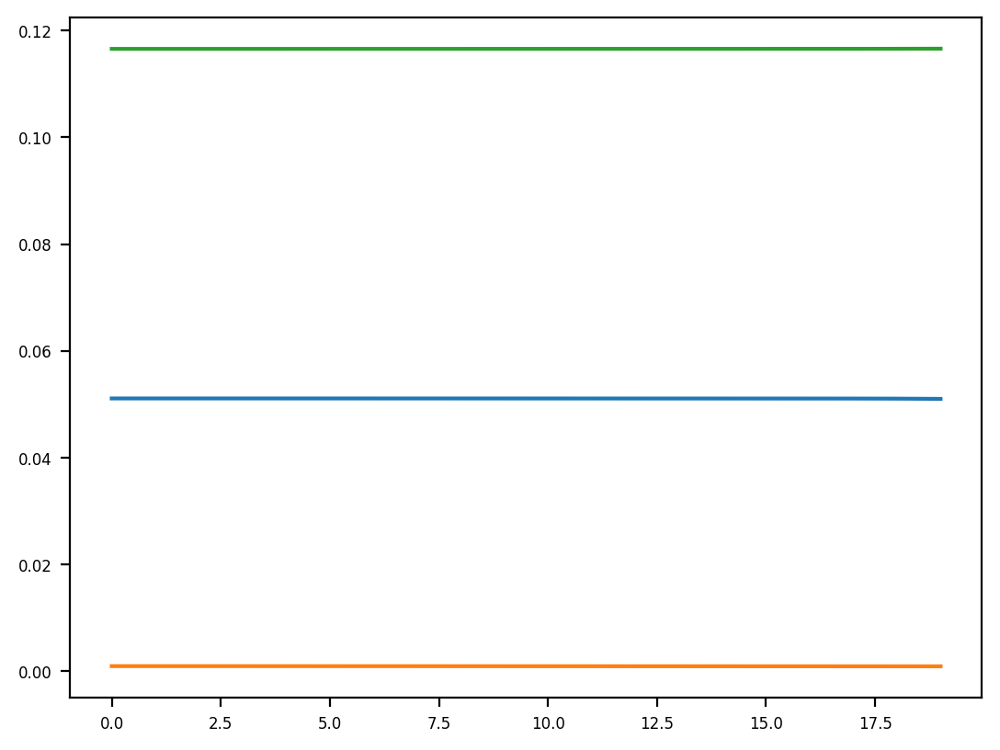

In [59]:
plt.plot(gt_ext)

In [27]:
get_extrinsic_calibration_frank(A, B)

array([[-0.35, -0.24,  0.9 ,  0.39],
       [-0.2 , -0.92, -0.33, -0.  ],
       [ 0.91, -0.3 ,  0.28,  0.17],
       [ 0.  ,  0.  ,  0.  ,  1.  ]])

In [28]:
get_extrinsic_calibration_tsai(A, B)

array([[-0.07,  0.62,  0.78,  0.56],
       [-0.82,  0.4 , -0.4 , -0.21],
       [-0.56, -0.67,  0.48,  0.43],
       [ 0.  ,  0.  ,  0.  ,  1.  ]])